In [2]:
import numpy as np   #for numerical analysis
import os             # to access OS functionality
import pandas as pd   # for datasets management
#import seaborn as sns             # for data-oriented plotting
import matplotlib.pyplot as plt   # for general plotting
import scipy.stats as stats       # for statistical analysis
import netCDF4 as nc
from netCDF4 import Dataset
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.font_manager
from IPython.core.display import HTML

In [3]:
#creating an absolute path to the data folder
base_path = '/Users/ciaraanderson/Downloads/Dissertation'       # base_path is a string
base_path = base_path+'/'      # add a slash at the end of the path. 
data_path = base_path+'diss_data/'  # in Python, the + can be used to join strings
print(data_path)              

#creating path to folders with data for fires (wf) and no fires (wof)
#wf_hpath means with fires hourly path
#wf_mpath mean with fires monthly path etc.
wf_hpath = data_path+'w_fires/hourly/'
wof_hpath = data_path+'wo_fires/hourly/'
wf_mpath = data_path+'w_fires/monthly/'
wof_mpath = data_path+'wo_fires/monthly/'
#check the pathway by printing
print(wf_hpath)

#defining folders where output will be saved
figures_path = data_path+'figures/'
out_path     = data_path+'output/'


/Users/ciaraanderson/Downloads/Dissertation/diss_data/
/Users/ciaraanderson/Downloads/Dissertation/diss_data/w_fires/hourly/


In [4]:
#reading in files and setting filepaths 
#files containing the monthly ozone model output data with fires
#setting filepath to 
    #Janurary with fire data
wf_Mjan = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-01.nc'
wf_Mfeb = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-02.nc'
wf_Mmar = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-03.nc'
wf_Mapr = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-04.nc'
wf_Mmay = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-05.nc'
wf_Mjun = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-06.nc'
wf_Mjul = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-07.nc'
wf_Maug = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-08.nc'
wf_Msep = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-09.nc'
wf_Moct = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-10.nc'
wf_Mnov = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-11.nc'
wf_Mdec = wf_mpath+ 'cesm220_FCnudged_f09_f09_mg17.cam.h0.2005-12.nc'

#files containing the monthly ozone model output data without fires
#setting filepath to 
#Janurary without fire data
wof_Mjan = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-01.nc'
wof_Mfeb = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-02.nc'
wof_Mmar = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-03.nc'
wof_Mapr = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-04.nc'
wof_Mmay = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-05.nc'
wof_Mjun = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-06.nc'
wof_Mjul = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-07.nc'
wof_Maug = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-08.nc'
wof_Msep = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-09.nc'
wof_Moct = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-10.nc'
wof_Mnov = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-11.nc'
wof_Mdec = wof_mpath+ 'cesm220_FCnudged_f09_f09_mg17_nofire.cam.h0.2005-12.nc'

In [5]:
#set font type
font = {'font':'Arial'}

In [6]:
#MAKING global maps of average ozone conc for each month with fires on (control) and off

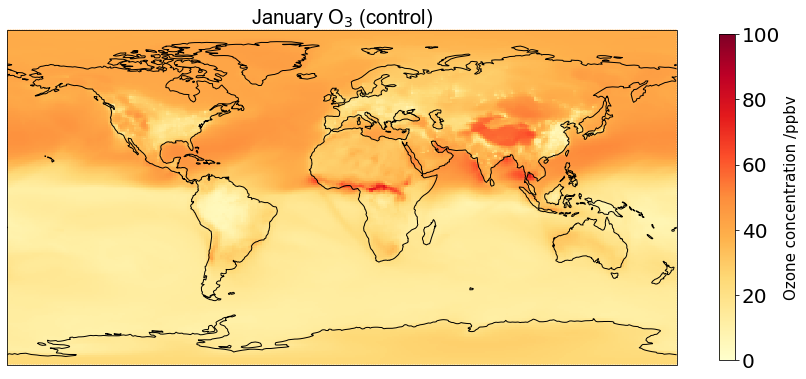

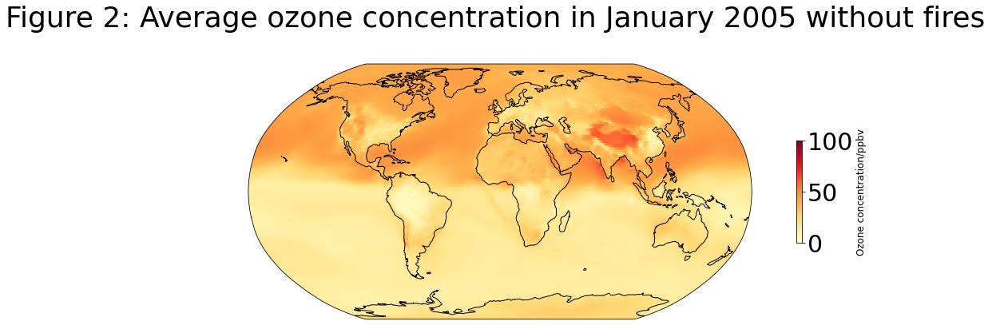

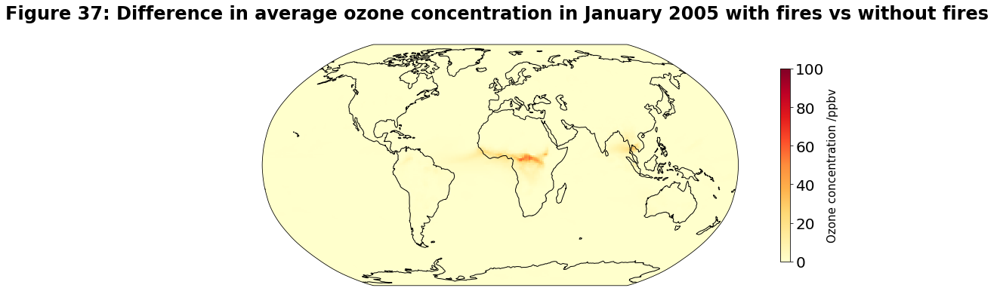

In [24]:
#January fires on
#Figure 1: Average ozone concentration in January 2005 with fires
#define the dataset 
wfmjand=Dataset(wf_Mjan) 
#wfmjand
#print variables
#print (wfmjand.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_1 = wfmjand.variables['lat'][:]
lon_1 = wfmjand.variables['lon'][:]
O3_1_mol = wfmjand.variables['O3'][:] #shape is time, lev, lat, lon
lev_1 = wfmjand.variables['lev'][:]

#need to multiply the O3_1_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_1 = O3_1_mol*10**(9)

#check the shape of the O3 array 
#print(O3_1.shape) #shape is (1, 56, 192, 288)
O3_1[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_1wf =O3_1[0,55,:,:]
#O3mean_1wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig1 = plt.figure(figsize=(15,15))
ax1 = fig1.add_subplot(projection=ccrs.PlateCarree())
#add coastlines
ax1.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg1 = ax1.pcolormesh(lon_1, lat_1, O3mean_1wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax1.set_title(r'January O$_3$ (control) ', **font)
#add colorbar
cb= fig1.colorbar(fg1, shrink=0.4)
cb.set_label('Ozone concentration /ppbv', fontsize=15)


#January fires off

#find ozone without fires
wofmjand=Dataset(wof_Mjan)
#print variables
#print (wofmjand.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_1wof = wofmjand.variables['lat'][:]
lon_1wof = wofmjand.variables['lon'][:]
O3_1wof_mol = wofmjand.variables['O3'][:] #shape is time, lev, lat, lon
lev_1wof = wofmjand.variables['lev'][:]

#need to multiply the O3_1wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_1wof = O3_1wof_mol*10**(9)

O3_1wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_1wof =O3_1wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig2 = plt.figure(figsize=(20,20))
ax2 = fig2.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax2.coastlines()
#set size of font
plt.rc('font', size=30)
#plot data
fg2 = ax2.pcolormesh(lon_1wof, lat_1wof, O3mean_1wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax2.set_title('Figure 2: Average ozone concentration in January 2005 without fires \n')
#add colorbar
cb= fig2.colorbar(fg2, shrink=0.4)
cb.set_label('Ozone concentration/ppbv', fontsize=12)



#now creating global map of difference in ozone concentraion (fires on- fires off)
#finding the difference between the fires on and fires off means
O3_1_difference = O3mean_1wf[:] - O3mean_1wof[:]

#plotting the difference data on the figure 
fig37 = plt.figure(figsize=(20,20))
ax37 = fig37.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax37.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg37 = ax37.pcolormesh(lon_1wof, lat_1wof, O3_1_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax37.set_title('Figure 37: Difference in average ozone concentration in January 2005 with fires vs without fires \n', fontweight='bold')
#add colorbar
cb= fig37.colorbar(fg37, shrink=0.8)
cb.set_label('Ozone concentration /ppbv', fontsize=15)

(1, 56, 192, 288)


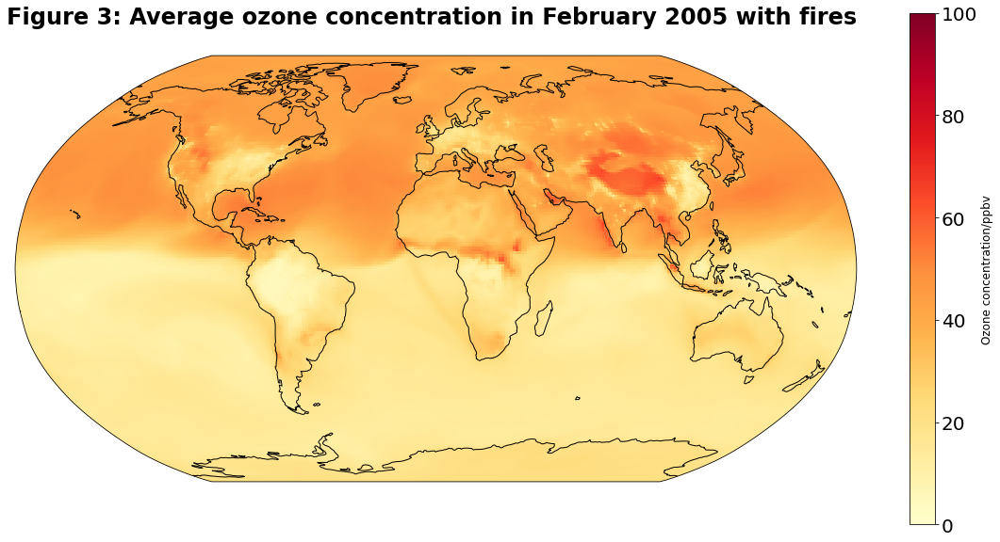

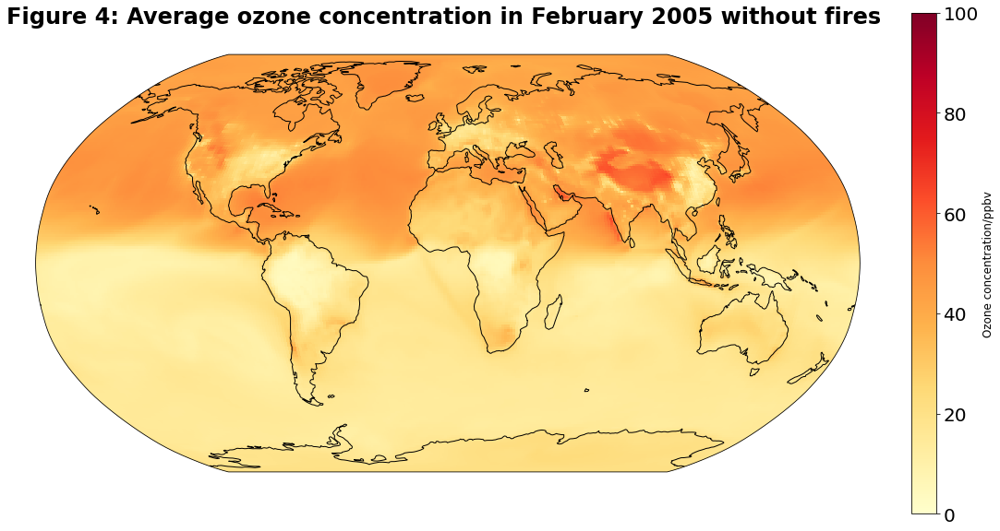

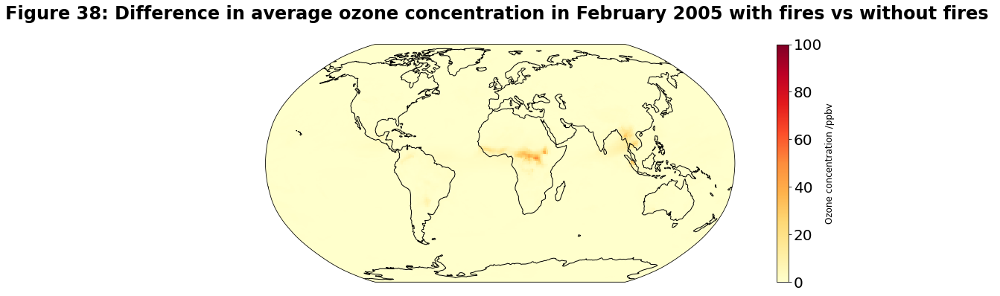

In [59]:
#February fires on
#define the dataset 
wfmfd=Dataset(wf_Mfeb) 
#print variables
#print (wfmfd.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_2 = wfmfd.variables['lat'][:]
lon_2 = wfmfd.variables['lon'][:]
O3_2_mol = wfmfd.variables['O3'][:] #shape is time, lev, lat, lon
lev_2 = wfmfd.variables['lev'][:]

#need to multiply the O3_2_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_2 = O3_2_mol*10**(9)

#check the shape of the O3 array 
print(O3_2.shape) #shape is (1, 56, 192, 288)
O3_2[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_2wf =O3_2[0,55,:,:]
#O3mean_2wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig3 = plt.figure(figsize=(20,20))
ax3 = fig3.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax3.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg3 = ax3.pcolormesh(lon_2, lat_2, O3mean_2wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax3.set_title('Figure 3: Average ozone concentration in February 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig3.colorbar(fg3, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#February fires off

#find ozone without fires
wofmfd=Dataset(wof_Mfeb)
#print variables
#print (wofmfd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_2wof = wofmfd.variables['lat'][:]
lon_2wof = wofmfd.variables['lon'][:]
O3_2wof_mol = wofmfd.variables['O3'][:] #shape is time, lev, lat, lon
lev_2wof = wofmfd.variables['lev'][:]

#need to multiply the O3_2wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_2wof = O3_2wof_mol*10**(9)

O3_2wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_2wof =O3_2wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig4 = plt.figure(figsize=(20,20))
ax4 = fig4.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax4.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg4 = ax4.pcolormesh(lon_2wof, lat_2wof, O3mean_2wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax4.set_title('Figure 4: Average ozone concentration in February 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig4.colorbar(fg4, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#now creating global map of difference in ozone concentraion (fires on- fires off)
#finding the difference between the fires on and fires off means
O3_2_difference = O3mean_2wf[:] - O3mean_2wof[:]

#plotting the difference data on the figure
fig38 = plt.figure(figsize=(20,20))
ax38 = fig38.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax38.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg38 = ax38.pcolormesh(lon_2wof, lat_2wof, O3_2_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title
ax38.set_title('Figure 38: Difference in average ozone concentration in February 2005 with fires vs without fires \n', fontweight='bold')
#add colorbar
cb= fig38.colorbar(fg38) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 

(1, 56, 192, 288)


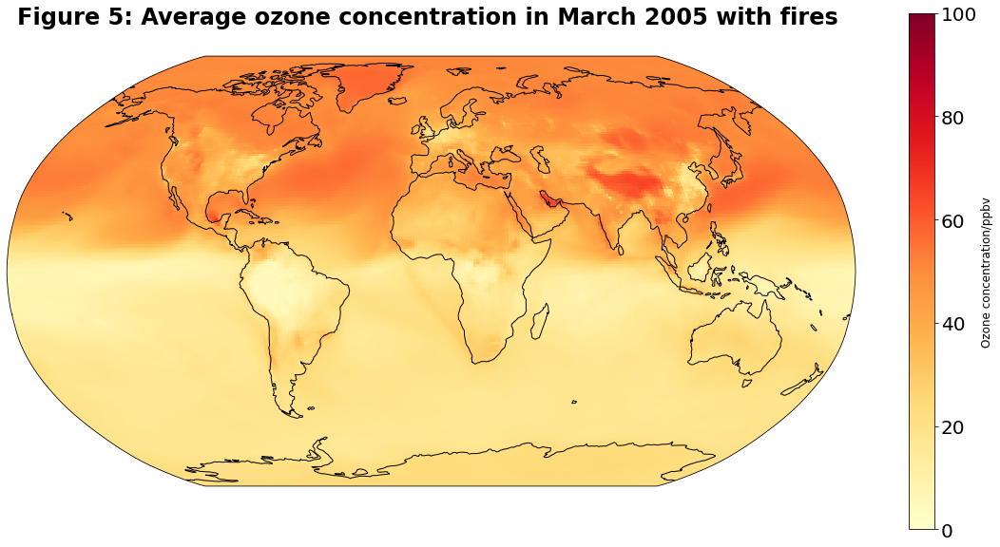

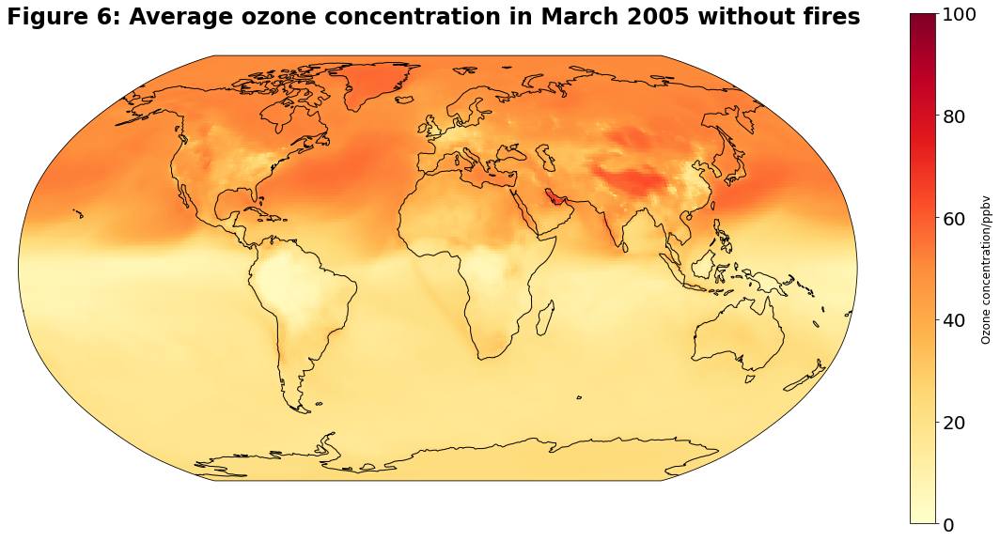

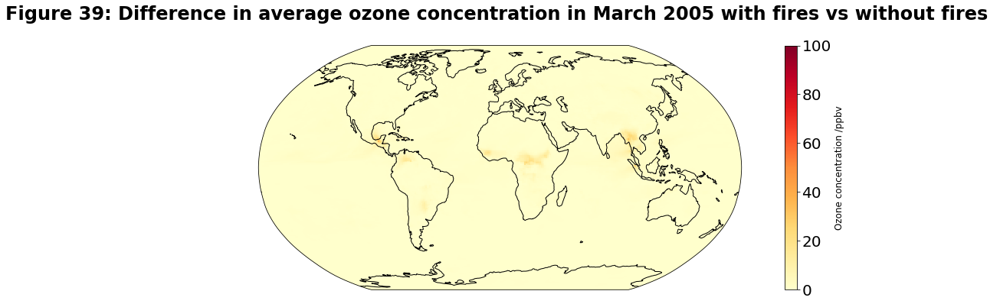

In [64]:
#March fires on
#define the dataset 
wfmmrd=Dataset(wf_Mmar) 
#print variables
#print (wfmmrd.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_3 = wfmmrd.variables['lat'][:]
lon_3 = wfmmrd.variables['lon'][:]
O3_3_mol = wfmmrd.variables['O3'][:] #shape is time, lev, lat, lon
lev_3 = wfmmrd.variables['lev'][:]

#need to multiply the O3_3_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_3 = O3_3_mol*10**(9)

#check the shape of the O3 array 
print(O3_3.shape) #shape is (1, 56, 192, 288)
O3_3[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_3wf =O3_3[0,55,:,:]
#O3mean_3wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig5 = plt.figure(figsize=(20,20))
ax5 = fig5.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax5.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg5 = ax5.pcolormesh(lon_3, lat_3, O3mean_3wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax5.set_title('Figure 5: Average ozone concentration in March 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig5.colorbar(fg5, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#March fires off

#find ozone without fires
wofmmrd=Dataset(wof_Mmar)
#print variables
#print (wofmmrd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_3wof = wofmmrd.variables['lat'][:]
lon_3wof = wofmmrd.variables['lon'][:]
O3_3wof_mol = wofmmrd.variables['O3'][:] #shape is time, lev, lat, lon
lev_3wof = wofmmrd.variables['lev'][:]

#need to multiply the O3_3wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_3wof = O3_3wof_mol*10**(9)

O3_3wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_3wof =O3_3wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig6 = plt.figure(figsize=(20,20))
ax6 = fig6.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax6.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg6 = ax6.pcolormesh(lon_3wof, lat_3wof, O3mean_3wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax6.set_title('Figure 6: Average ozone concentration in March 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig6.colorbar(fg6, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#now creating global map of difference in ozone concentraion (fires on- fires off)
#finding the difference between the fires on and fires off means
O3_3_difference = O3mean_3wf[:] - O3mean_3wof[:]

#plotting the difference data on the figure
fig39 = plt.figure(figsize=(20,20))
ax39 = fig39.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines 
ax39.coastlines() 
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg39 = ax39.pcolormesh(lon_3wof, lat_3wof, O3_3_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax39.set_title('Figure 39: Difference in average ozone concentration in March 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig39.colorbar(fg39)
cb.set_label('Ozone concentration /ppbv', fontsize=12) 

(1, 56, 192, 288)


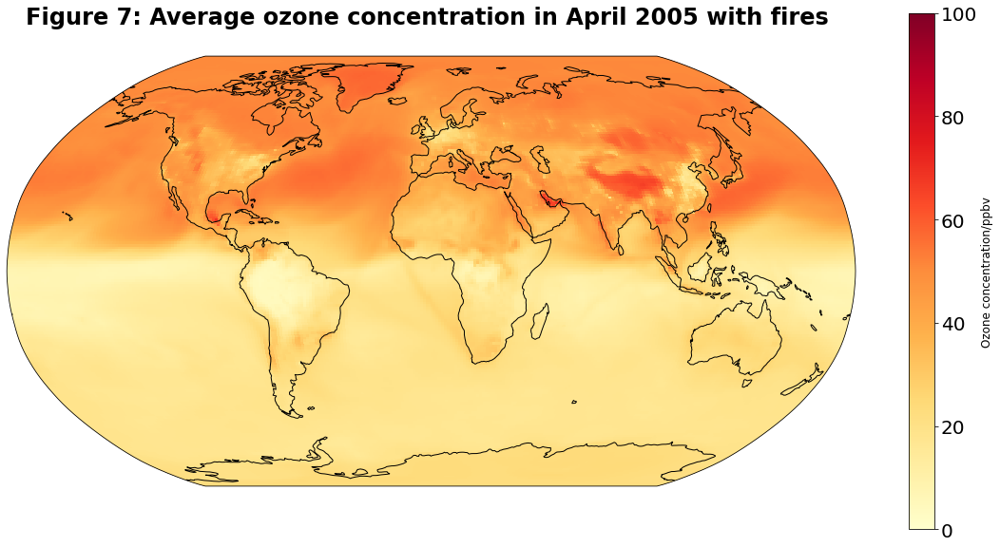

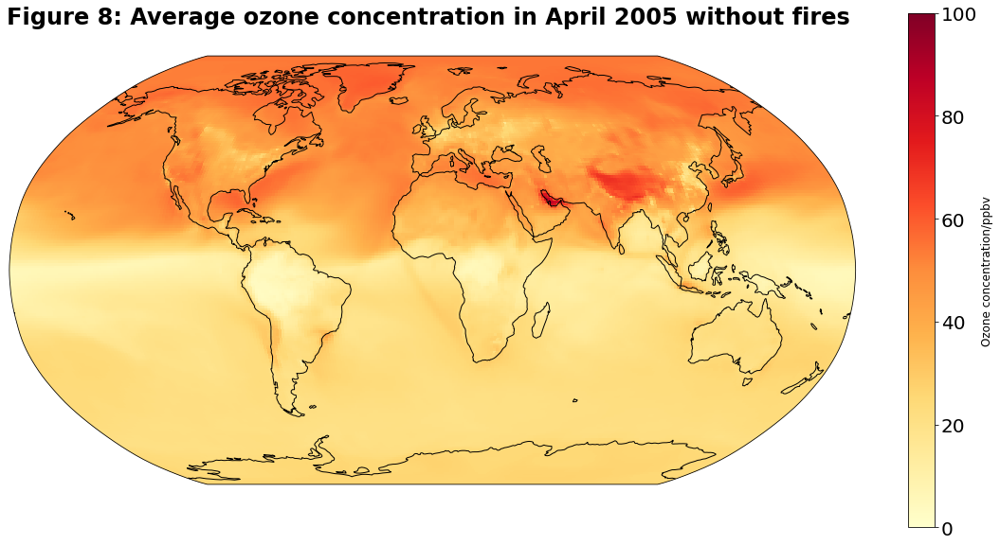

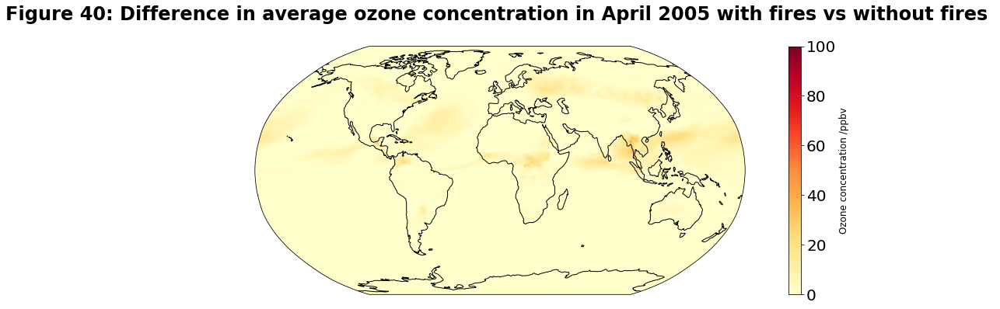

In [65]:
#April fires on
#define the dataset 
wfmapd=Dataset(wf_Mapr) 
#print variables
#print (wfmapd.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_4 = wfmapd.variables['lat'][:]
lon_4 = wfmapd.variables['lon'][:]
O3_4_mol = wfmapd.variables['O3'][:] #shape is time, lev, lat, lon
lev_4 = wfmapd.variables['lev'][:]

#need to multiply the O3_4_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_4 = O3_4_mol*10**(9)

#check the shape of the O3 array 
print(O3_4.shape) #shape is (1, 56, 192, 288)
O3_4[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_4wf =O3_3[0,55,:,:]
#O3mean_4wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig7 = plt.figure(figsize=(20,20))
ax7 = fig7.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax7.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg7 = ax7.pcolormesh(lon_4, lat_4, O3mean_4wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax7.set_title('Figure 7: Average ozone concentration in April 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig7.colorbar(fg7, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#April fires off

#find ozone without fires
wofmapd=Dataset(wof_Mapr)
#print variables
#print (wofmapd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_4wof = wofmapd.variables['lat'][:]
lon_4wof = wofmapd.variables['lon'][:]
O3_4wof_mol = wofmapd.variables['O3'][:] #shape is time, lev, lat, lon
lev_4wof = wofmapd.variables['lev'][:]

#need to multiply the O3_4wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_4wof = O3_4wof_mol*10**(9)

O3_4wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_4wof =O3_4wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig8 = plt.figure(figsize=(20,20))
ax8 = fig8.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax8.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg8 = ax8.pcolormesh(lon_4wof, lat_4wof, O3mean_4wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax8.set_title('Figure 8: Average ozone concentration in April 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig8.colorbar(fg8, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#now creating global map of difference in ozone concentraion (fires on- fires off) 
#finding the difference between the fires on and fires off means 
O3_4_difference = O3mean_4wf[:] - O3mean_4wof[:] 

#plotting the difference data on the figure 
fig40 = plt.figure(figsize=(20,20)) 
ax40 = fig40.add_subplot(3,1,1, projection=ccrs.Robinson()) 
#add coastlines 
ax40.coastlines() 
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg40 = ax40.pcolormesh(lon_4wof, lat_4wof, O3_4_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax40.set_title('Figure 40: Difference in average ozone concentration in April 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig40.colorbar(fg40) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 

(1, 56, 192, 288)


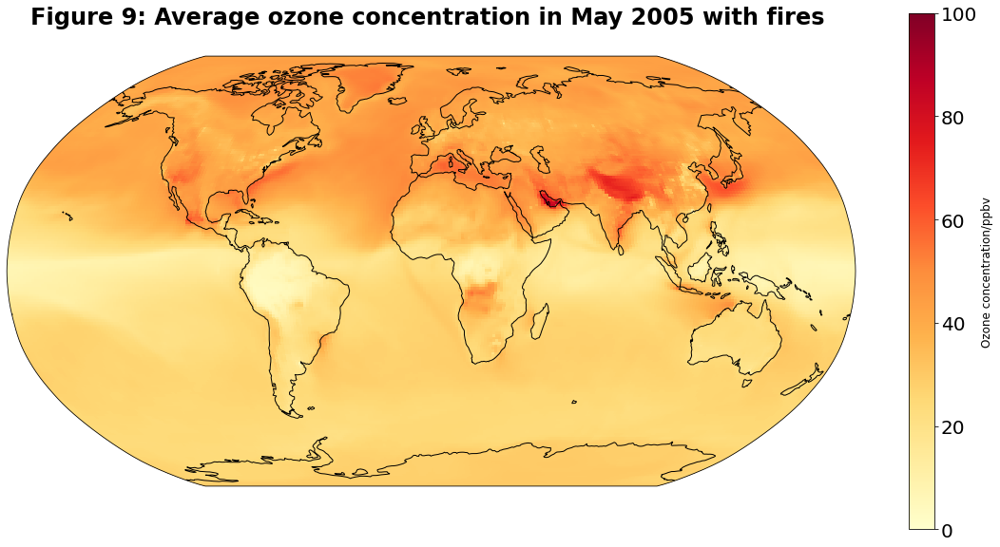

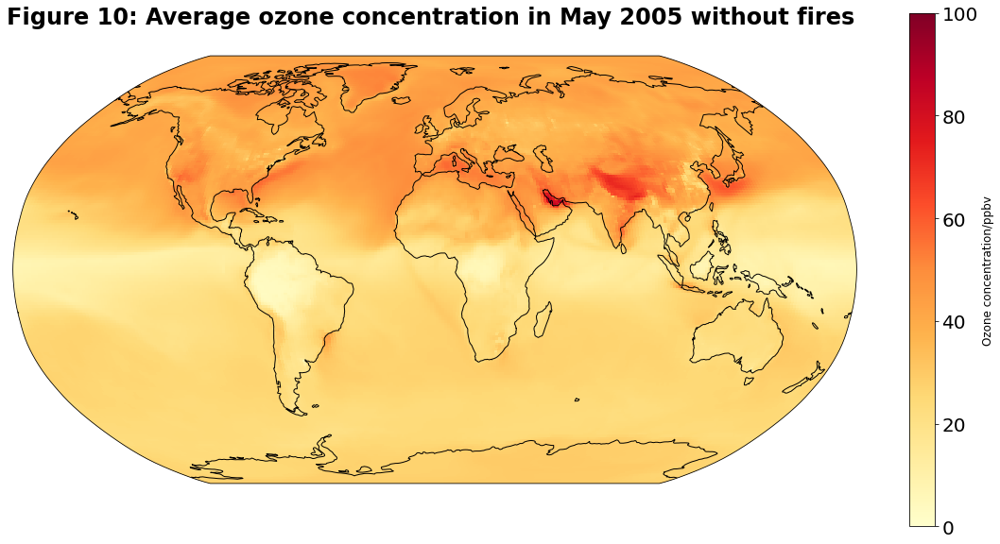

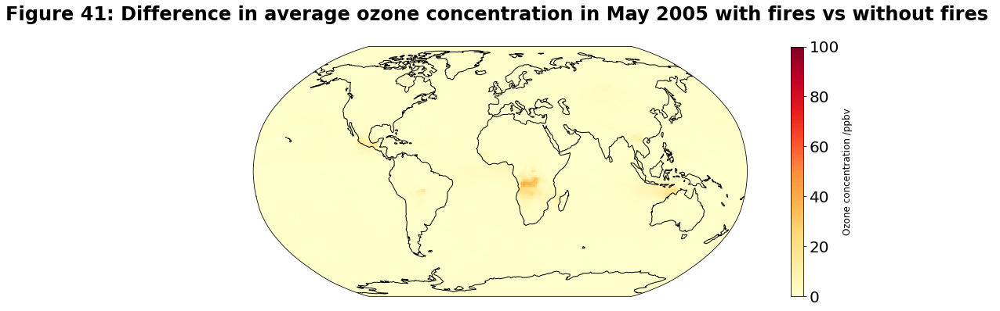

In [66]:
#May fires on
#define the dataset 
wfmmyd=Dataset(wf_Mmay) 
#print variables
#print (wfmmyd.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_5 = wfmmyd.variables['lat'][:]
lon_5 = wfmmyd.variables['lon'][:]
O3_5_mol = wfmmyd.variables['O3'][:] #shape is time, lev, lat, lon
lev_5 = wfmmyd.variables['lev'][:]

#need to multiply the O3_5_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_5 = O3_5_mol*10**(9)

#check the shape of the O3 array 
print(O3_5.shape) #shape is (1, 56, 192, 288)
O3_5[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_5wf =O3_5[0,55,:,:]
#O3mean_5wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig9 = plt.figure(figsize=(20,20))
ax9 = fig9.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax9.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg9 = ax9.pcolormesh(lon_5, lat_5, O3mean_5wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax9.set_title('Figure 9: Average ozone concentration in May 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig9.colorbar(fg9, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#May fires off

#find ozone without fires
wofmmyd=Dataset(wof_Mmay)
#print variables
#print (wofmmyd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_5wof = wofmmyd.variables['lat'][:]
lon_5wof = wofmmyd.variables['lon'][:]
O3_5wof_mol = wofmmyd.variables['O3'][:] #shape is time, lev, lat, lon
lev_5wof = wofmmyd.variables['lev'][:]

#need to multiply the O3_2wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_5wof = O3_5wof_mol*10**(9)

O3_5wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_5wof =O3_5wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig10 = plt.figure(figsize=(20,20))
ax10 = fig10.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax10.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg10 = ax10.pcolormesh(lon_5wof, lat_5wof, O3mean_5wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax10.set_title('Figure 10: Average ozone concentration in May 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig10.colorbar(fg10, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)



#now creating global map of difference in ozone concentraion (fires on- fires off) 
#finding the difference between the fires on and fires off means 
O3_5_difference = O3mean_5wf[:] - O3mean_5wof[:] 

#plotting the difference data on the figure 
fig41 = plt.figure(figsize=(20,20)) 
ax41 = fig41.add_subplot(3,1,1, projection=ccrs.Robinson()) 
#add coastlines 
ax41.coastlines() 
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg41 = ax41.pcolormesh(lon_5wof, lat_5wof, O3_5_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax41.set_title('Figure 41: Difference in average ozone concentration in May 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig41.colorbar(fg41) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 


(1, 56, 192, 288)


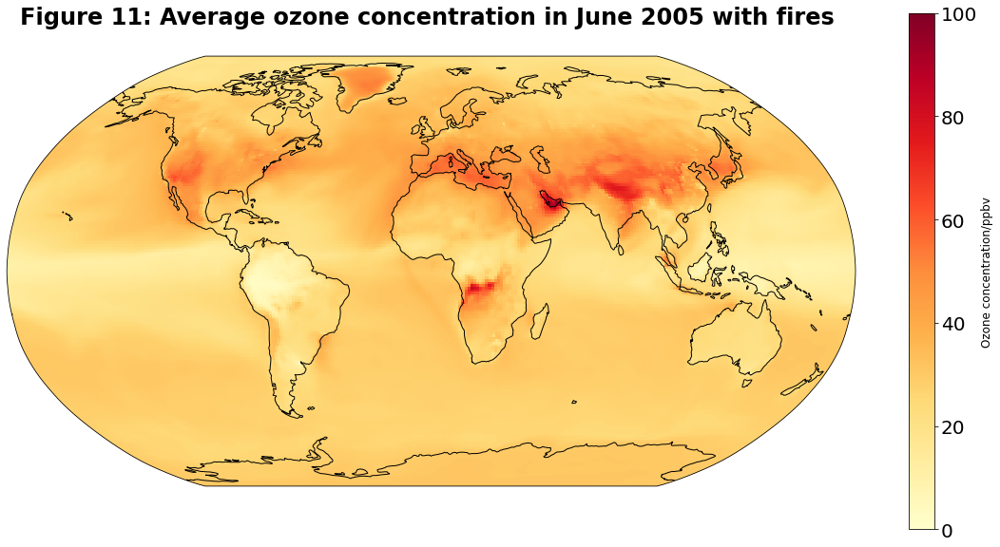

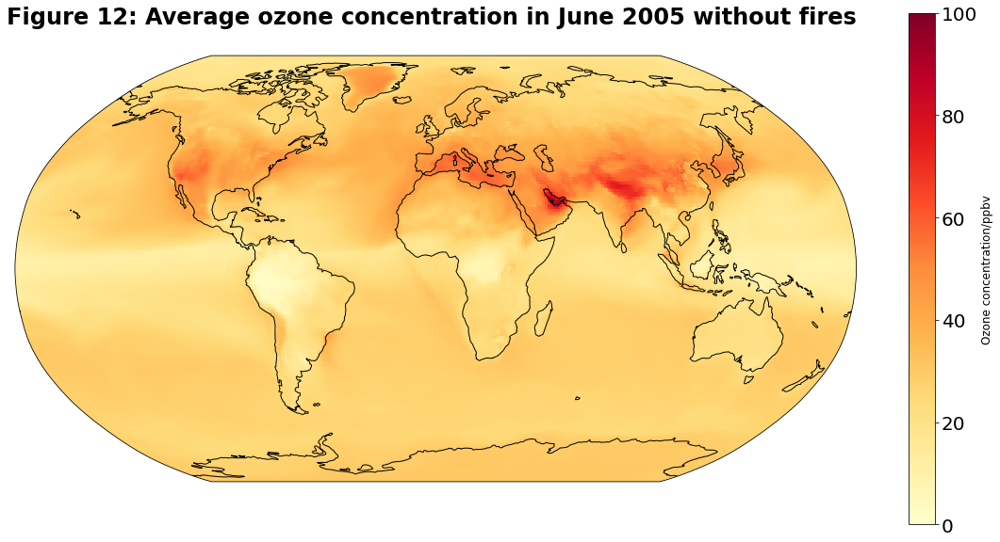

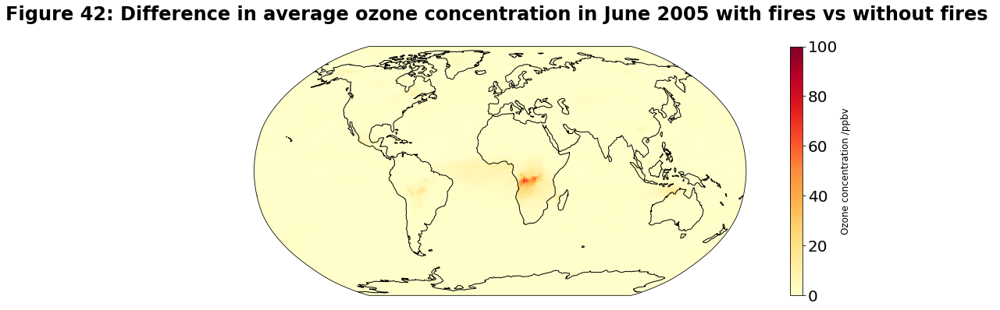

In [67]:

#June fires on
#define the dataset 
wfmjd=Dataset(wf_Mjun) 
#wfmjd
#print variables
#print (wfmjd.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_6 = wfmjd.variables['lat'][:]
lon_6 = wfmjd.variables['lon'][:]
O3_6_mol = wfmjd.variables['O3'][:] #shape is time, lev, lat, lon
lev_6 = wfmjd.variables['lev'][:]

#need to multiply the O3_6_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_6 = O3_6_mol*10**(9)

#check the shape of the O3 array 
print(O3_6.shape) #shape is (1, 56, 192, 288)
O3_6[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_6wf =O3_6[0,55,:,:]
#O3mean_6wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig11 = plt.figure(figsize=(20,20))
ax11 = fig11.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax11.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg11 = ax11.pcolormesh(lon_6, lat_6, O3mean_6wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax11.set_title('Figure 11: Average ozone concentration in June 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig11.colorbar(fg11, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#June fires off

#find ozone for june without fires
wofmjd=Dataset(wof_Mjun)
#print variables
#print (wofmjd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_6wof = wofmjd.variables['lat'][:]
lon_6wof = wofmjd.variables['lon'][:]
O3_6wof_mol = wofmjd.variables['O3'][:] #shape is time, lev, lat, lon
lev_6wof = wofmjd.variables['lev'][:]

#need to multiply the O3_6wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_6wof = O3_6wof_mol*10**(9)

O3_6wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_6wof =O3_6wof[0,55,:,:]

#plot june without fires
#plotting data on the figure 
#initiate new figure and axis 
fig12 = plt.figure(figsize=(20,20))
ax12 = fig12.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax12.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg12 = ax12.pcolormesh(lon_6wof, lat_6wof, O3mean_6wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax12.set_title('Figure 12: Average ozone concentration in June 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig12.colorbar(fg12, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)

#now creating global map of difference in ozone concentraion (fires on- fires off) 
#finding the difference between the fires on and fires off means 
O3_6_difference = O3mean_6wf[:] - O3mean_6wof[:] 

#plotting the difference data on the figure 
fig42 = plt.figure(figsize=(20,20)) 
ax42 = fig42.add_subplot(3,1,1, projection=ccrs.Robinson()) 
#add coastlines 
ax42.coastlines() 
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg42 = ax42.pcolormesh(lon_6wof, lat_6wof, O3_6_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax42.set_title('Figure 42: Difference in average ozone concentration in June 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig42.colorbar(fg42) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 

(1, 56, 192, 288)


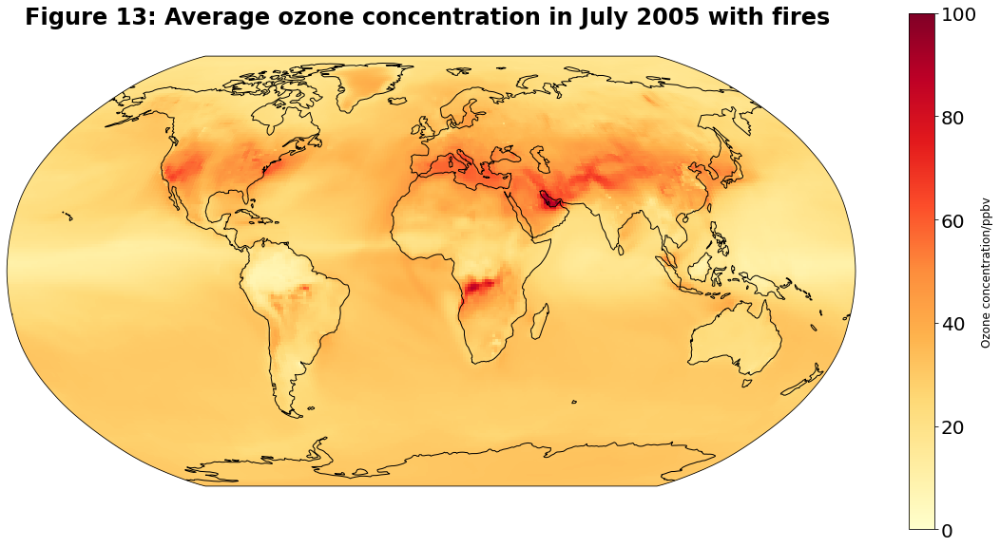

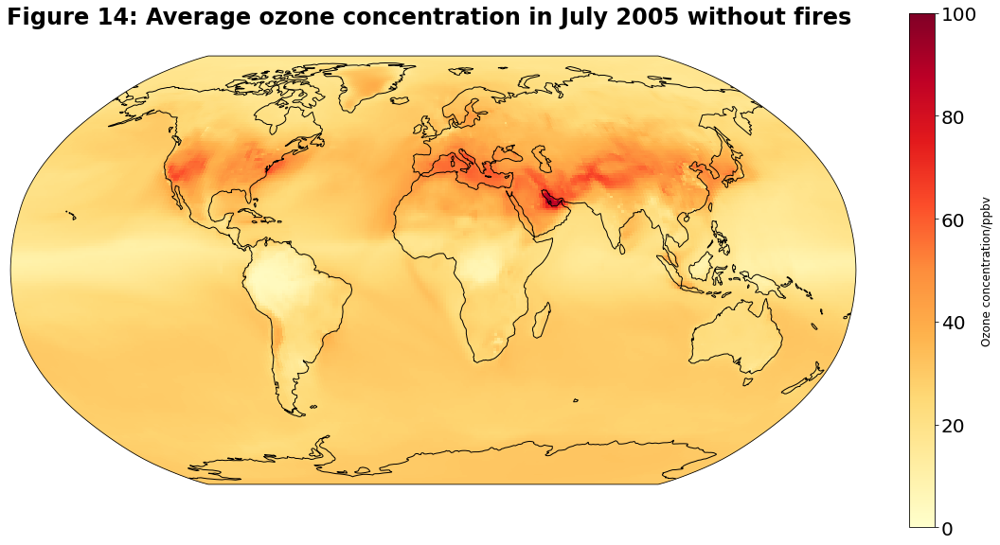

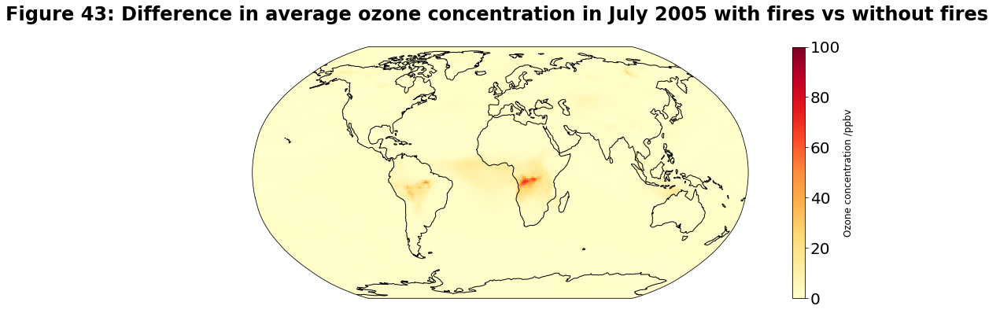

In [68]:
#JULY fires on
#define the dataset 
wfmjyd=Dataset(wf_Mjul) 
#print variables
#print (wfmjyd.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_7 = wfmjyd.variables['lat'][:]
lon_7 = wfmjyd.variables['lon'][:]
O3_7_mol = wfmjyd.variables['O3'][:] #shape is time, lev, lat, lon
lev_7 = wfmjyd.variables['lev'][:]

#need to multiply the O3_7_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_7 = O3_7_mol*10**(9)

#check the shape of the O3 array 
print(O3_7.shape) #shape is (1, 56, 192, 288)
O3_7[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_7wf =O3_7[0,55,:,:]
#O3mean_7wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig13 = plt.figure(figsize=(20,20))
ax13 = fig13.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax13.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg13 = ax13.pcolormesh(lon_7, lat_7, O3mean_7wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax13.set_title('Figure 13: Average ozone concentration in July 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig13.colorbar(fg13, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#July fires off

#find ozone without fires
wofmjyd=Dataset(wof_Mjul)
#print variables
#print (wofmmyd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_7wof = wofmjyd.variables['lat'][:]
lon_7wof = wofmjyd.variables['lon'][:]
O3_7wof_mol = wofmjyd.variables['O3'][:] #shape is time, lev, lat, lon
lev_7wof = wofmjyd.variables['lev'][:]

#need to multiply the O3_2wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_7wof = O3_7wof_mol*10**(9)

O3_7wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_7wof =O3_7wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig14 = plt.figure(figsize=(20,20))
ax14 = fig14.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax14.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg14 = ax14.pcolormesh(lon_7wof, lat_7wof, O3mean_7wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax14.set_title('Figure 14: Average ozone concentration in July 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig14.colorbar(fg14, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)



#now creating global map of difference in ozone concentraion (fires on- fires off) 
#finding the difference between the fires on and fires off means 
O3_7_difference = O3mean_7wf[:] - O3mean_7wof[:] 

#plotting the difference data on the figure 
fig43 = plt.figure(figsize=(20,20)) 
ax43 = fig43.add_subplot(3,1,1, projection=ccrs.Robinson()) 
#add coastlines 
ax43.coastlines()
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg43 = ax43.pcolormesh(lon_7wof, lat_7wof, O3_7_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax43.set_title('Figure 43: Difference in average ozone concentration in July 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig43.colorbar(fg43) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 

(1, 56, 192, 288)


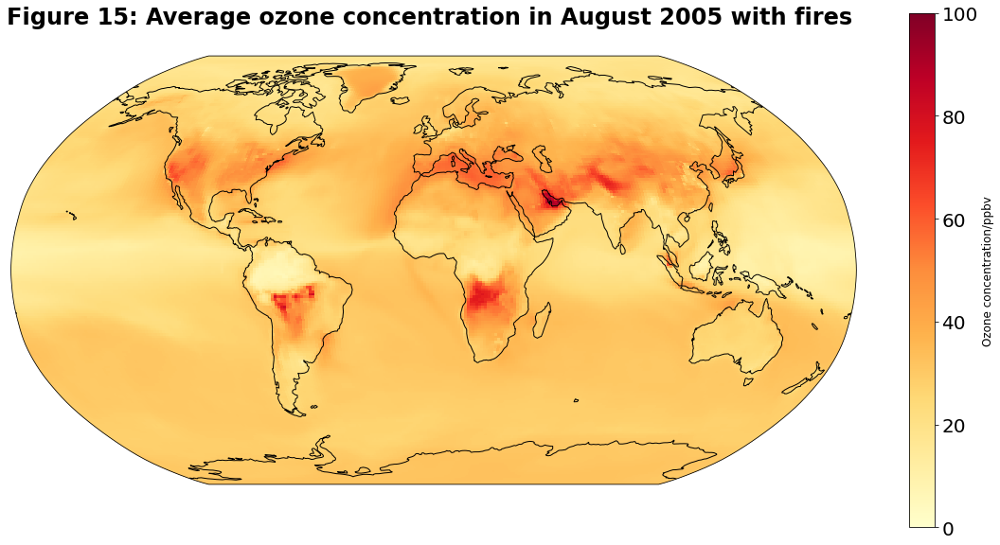

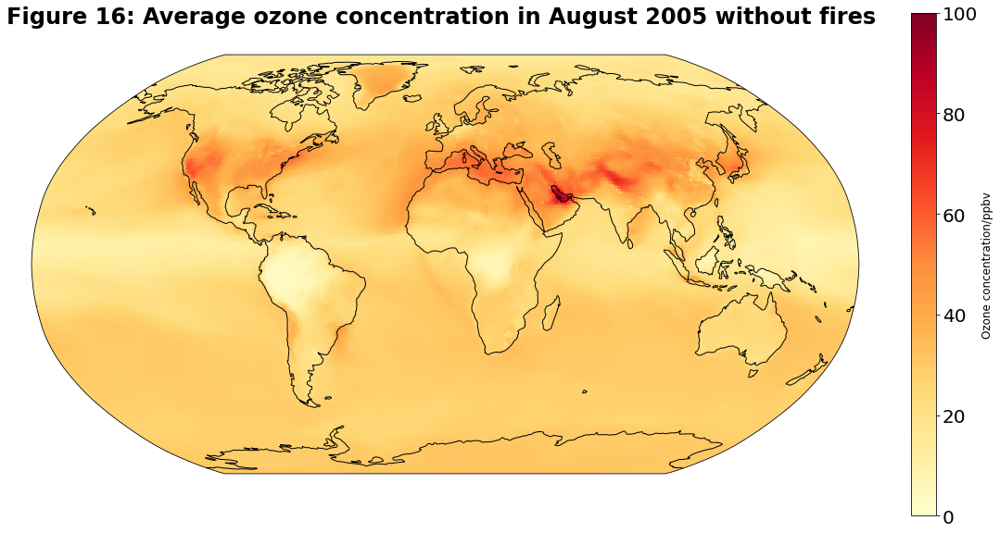

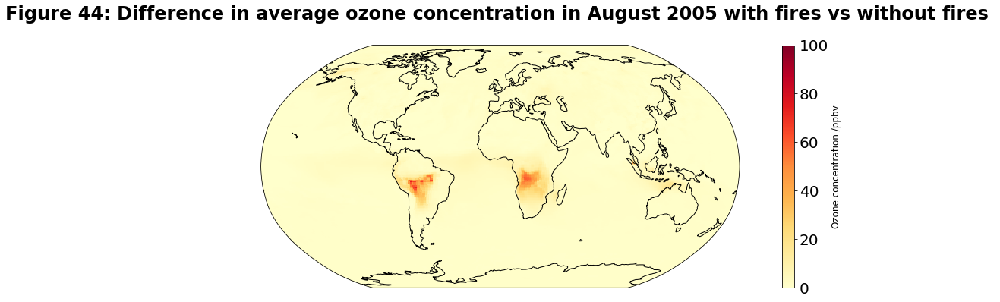

In [69]:
#AUGUST fires on
#define the dataset 
wfmad=Dataset(wf_Maug) 
#print variables
#print (wfmad.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_8 = wfmad.variables['lat'][:]
lon_8 = wfmad.variables['lon'][:]
O3_8_mol = wfmad.variables['O3'][:] #shape is time, lev, lat, lon
lev_8 = wfmad.variables['lev'][:]

#need to multiply the O3_7_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_8 = O3_8_mol*10**(9)

#check the shape of the O3 array 
print(O3_8.shape) #shape is (1, 56, 192, 288)
O3_8[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_8wf =O3_8[0,55,:,:]
#O3mean_8wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig15 = plt.figure(figsize=(20,20))
ax15 = fig15.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax15.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg15 = ax15.pcolormesh(lon_8, lat_8, O3mean_8wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax15.set_title('Figure 15: Average ozone concentration in August 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig15.colorbar(fg15, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#AUGUST fires off

#find ozone without fires
wofmad=Dataset(wof_Maug)
#print variables
#print (wofmmyd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_8wof = wofmad.variables['lat'][:]
lon_8wof = wofmad.variables['lon'][:]
O3_8wof_mol = wofmad.variables['O3'][:] #shape is time, lev, lat, lon
lev_8wof = wofmad.variables['lev'][:]

#need to multiply the O3_8wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_8wof = O3_8wof_mol*10**(9)

O3_8wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_8wof =O3_8wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig16 = plt.figure(figsize=(20,20))
ax16 = fig16.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax16.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg16 = ax16.pcolormesh(lon_8wof, lat_8wof, O3mean_8wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax16.set_title('Figure 16: Average ozone concentration in August 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig16.colorbar(fg16, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#now creating global map of difference in ozone concentraion (fires on- fires off) 
#finding the difference between the fires on and fires off means 
O3_8_difference = O3mean_8wf[:] - O3mean_8wof[:] 

#plotting the difference data on the figure 
fig44 = plt.figure(figsize=(20,20)) 
ax44 = fig44.add_subplot(3,1,1, projection=ccrs.Robinson()) 
#add coastlines 
ax44.coastlines() 
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg44 = ax44.pcolormesh(lon_8wof, lat_8wof, O3_8_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax44.set_title('Figure 44: Difference in average ozone concentration in August 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig44.colorbar(fg44) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 

(1, 56, 192, 288)


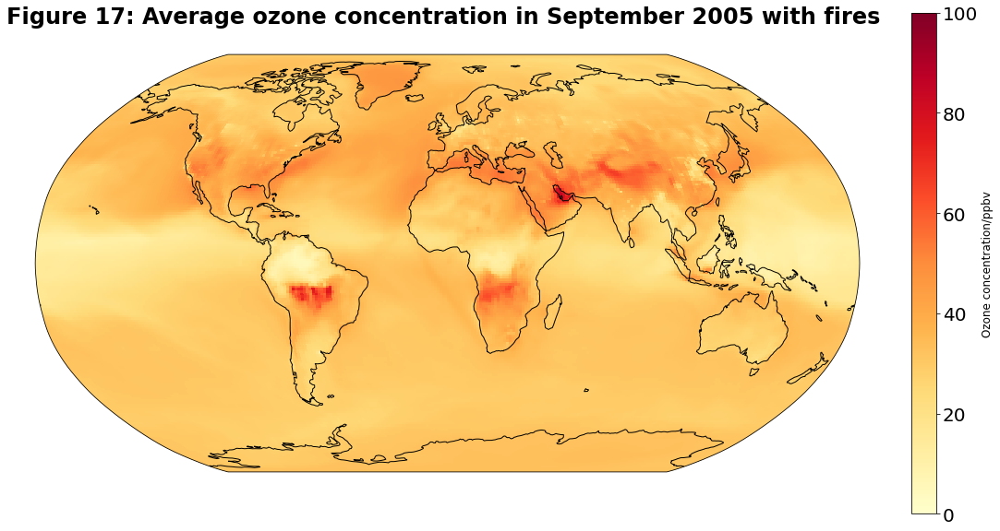

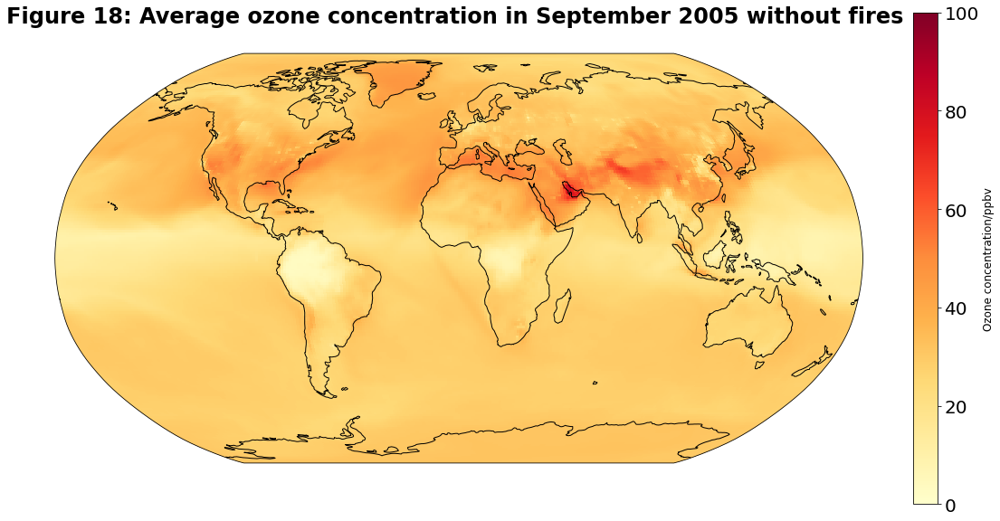

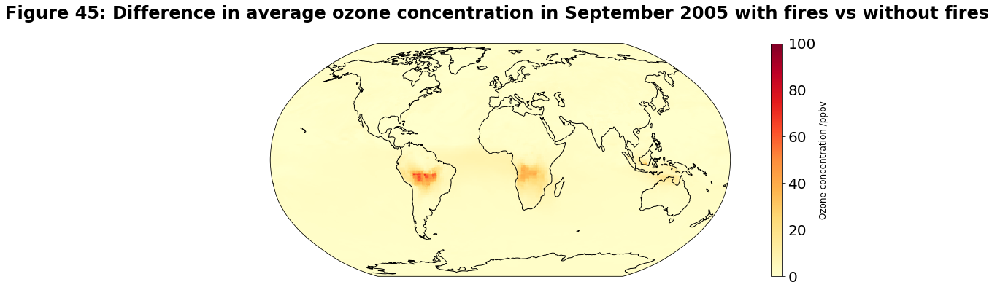

In [70]:
#SEPTEMBER fires on
#define the dataset 
wfmsd=Dataset(wf_Msep) 
#print variables
#print (wfmad.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_9 = wfmsd.variables['lat'][:]
lon_9 = wfmsd.variables['lon'][:]
O3_9_mol = wfmsd.variables['O3'][:] #shape is time, lev, lat, lon
lev_9 = wfmsd.variables['lev'][:]

#need to multiply the O3_9_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_9 = O3_9_mol*10**(9)

#check the shape of the O3 array 
print(O3_9.shape) #shape is (1, 56, 192, 288)
O3_9[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_9wf =O3_9[0,55,:,:]
#O3mean_9wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig17 = plt.figure(figsize=(20,20))
ax17 = fig17.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax17.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg17 = ax17.pcolormesh(lon_9, lat_9, O3mean_9wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax17.set_title('Figure 17: Average ozone concentration in September 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig17.colorbar(fg17, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#SEPTEMBER fires off

#find ozone without fires
wofmsd=Dataset(wof_Msep)
#print variables
#print (wofmsd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_9wof = wofmsd.variables['lat'][:]
lon_9wof = wofmsd.variables['lon'][:]
O3_9wof_mol = wofmsd.variables['O3'][:] #shape is time, lev, lat, lon
lev_9wof = wofmsd.variables['lev'][:]

#need to multiply the O3_9wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_9wof = O3_9wof_mol*10**(9)

O3_9wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_9wof =O3_9wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig18 = plt.figure(figsize=(20,20))
ax18 = fig18.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax18.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg18 = ax18.pcolormesh(lon_9wof, lat_9wof, O3mean_9wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax18.set_title('Figure 18: Average ozone concentration in September 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig18.colorbar(fg18, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#now creating global map of difference in ozone concentraion (fires on- fires off) 
#finding the difference between the fires on and fires off means 
O3_9_difference = O3mean_9wf[:] - O3mean_9wof[:] 

#plotting the difference data on the figure 
fig45 = plt.figure(figsize=(20,20)) 
ax45 = fig45.add_subplot(3,1,1, projection=ccrs.Robinson()) 
#add coastlines 
ax45.coastlines() 
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg45 = ax45.pcolormesh(lon_9wof, lat_9wof, O3_9_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax45.set_title('Figure 45: Difference in average ozone concentration in September 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig45.colorbar(fg45) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 

(1, 56, 192, 288)


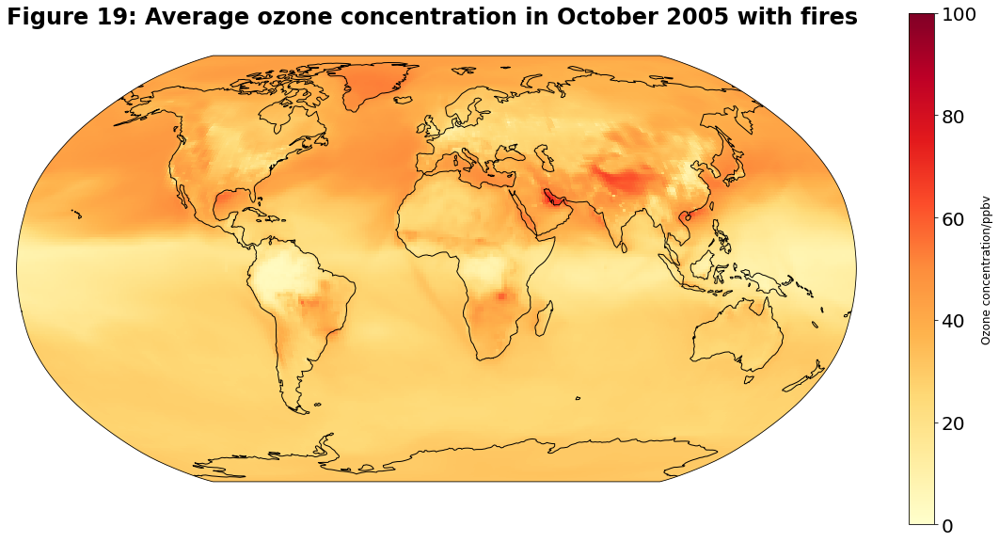

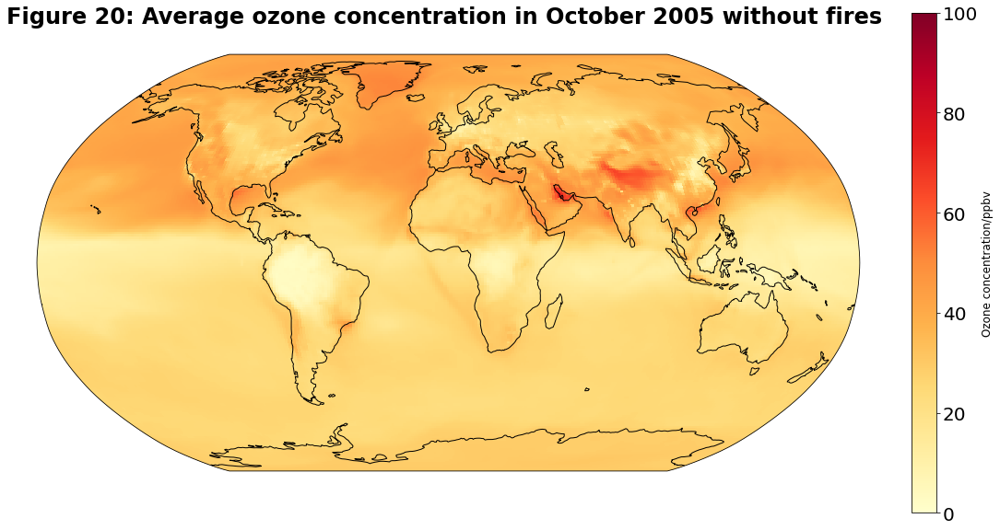

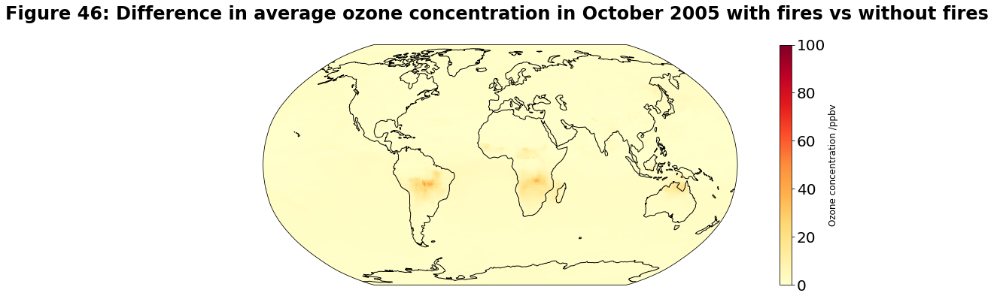

In [71]:
#OCTOBER fires on
#define the dataset 
wfmod=Dataset(wf_Moct) 
#print variables
#print (wfmod.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_10 = wfmod.variables['lat'][:]
lon_10 = wfmod.variables['lon'][:]
O3_10_mol = wfmod.variables['O3'][:] #shape is time, lev, lat, lon
lev_10 = wfmod.variables['lev'][:]

#need to multiply the O3_10_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_10 = O3_10_mol*10**(9)

#check the shape of the O3 array 
print(O3_10.shape) #shape is (1, 56, 192, 288)
O3_10[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_10wf =O3_10[0,55,:,:]
#O3mean_10wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig19 = plt.figure(figsize=(20,20))
ax19 = fig19.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax19.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg19 = ax19.pcolormesh(lon_10, lat_10, O3mean_10wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax19.set_title('Figure 19: Average ozone concentration in October 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig19.colorbar(fg19, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#OCTOBER fires off

#find ozone without fires
wofmod=Dataset(wof_Moct)
#print variables
#print (wofmod.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_10wof = wofmod.variables['lat'][:]
lon_10wof = wofmod.variables['lon'][:]
O3_10wof_mol = wofmod.variables['O3'][:] #shape is time, lev, lat, lon
lev_10wof = wofmod.variables['lev'][:]

#need to multiply the O3_10wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_10wof = O3_10wof_mol*10**(9)

O3_10wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_10wof =O3_10wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig20 = plt.figure(figsize=(20,20))
ax20 = fig20.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax20.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg20 = ax20.pcolormesh(lon_10wof, lat_10wof, O3mean_10wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax20.set_title('Figure 20: Average ozone concentration in October 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig20.colorbar(fg20, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#now creating global map of difference in ozone concentraion (fires on- fires off)
#finding the difference between the fires on and fires off means
O3_10_difference = O3mean_10wf[:] - O3mean_10wof[:] 

#plotting the difference data on the figure 
fig46 = plt.figure(figsize=(20,20)) 
ax46 = fig46.add_subplot(3,1,1, projection=ccrs.Robinson()) 
#add coastlines 
ax46.coastlines() 
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg46 = ax46.pcolormesh(lon_10wof, lat_10wof, O3_10_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax46.set_title('Figure 46: Difference in average ozone concentration in October 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig46.colorbar(fg46) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 


(1, 56, 192, 288)


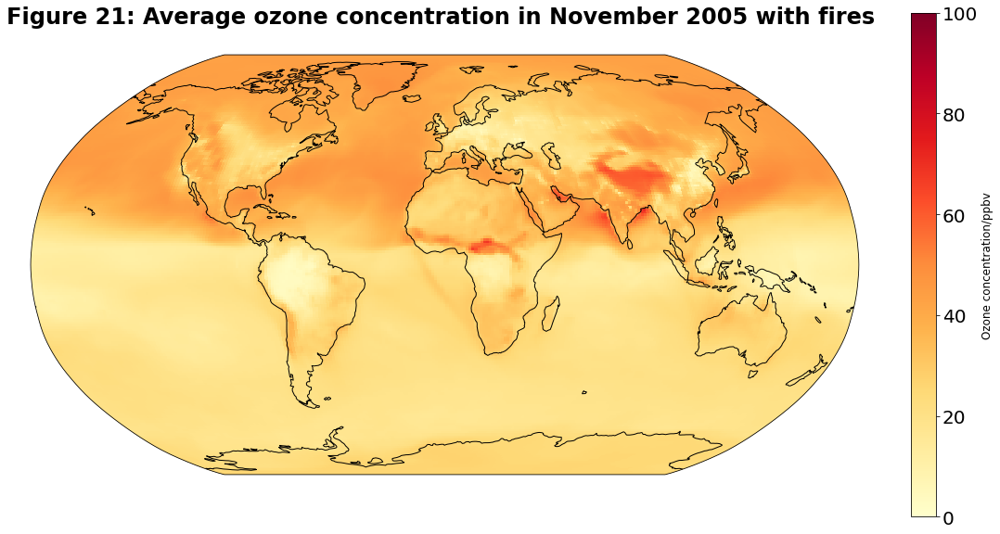

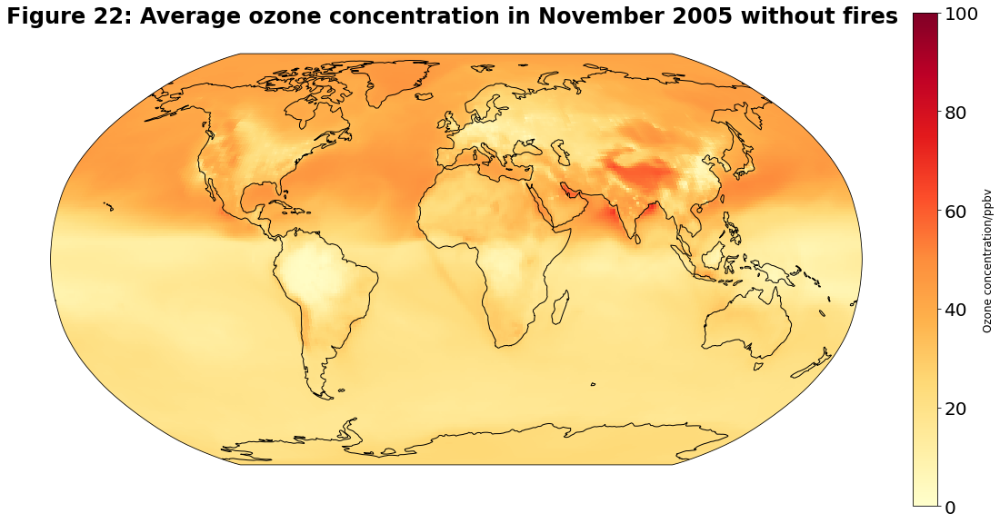

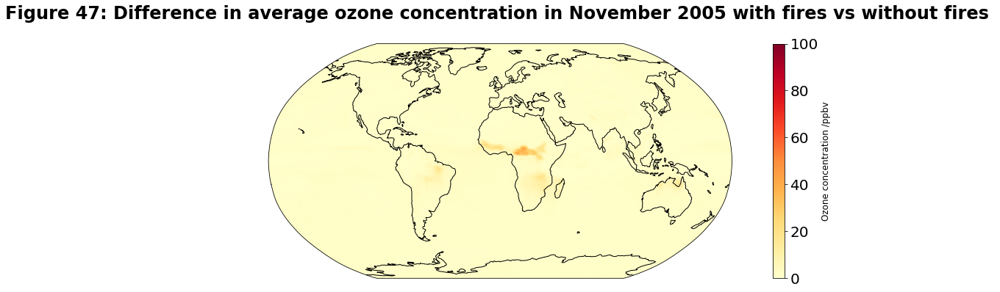

In [72]:
#NOVEMBER fires on
#define the dataset 
wfmnd=Dataset(wf_Mnov) 
#print variables
#print (wfmnd.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_11 = wfmnd.variables['lat'][:]
lon_11 = wfmnd.variables['lon'][:]
O3_11_mol = wfmnd.variables['O3'][:] #shape is time, lev, lat, lon
lev_11 = wfmnd.variables['lev'][:]

#need to multiply the O3_11_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_11 = O3_11_mol*10**(9)

#check the shape of the O3 array 
print(O3_11.shape) #shape is (1, 56, 192, 288)
O3_11[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_11wf =O3_11[0,55,:,:]
#O3mean_11wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig21 = plt.figure(figsize=(20,20))
ax21 = fig21.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax21.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg21 = ax21.pcolormesh(lon_11, lat_11, O3mean_11wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax21.set_title('Figure 21: Average ozone concentration in November 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig21.colorbar(fg21, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#NOVEMBER fires off

#find ozone without fires
wofmnd=Dataset(wof_Mnov)
#print variables
#print (wofmnd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_11wof = wofmnd.variables['lat'][:]
lon_11wof = wofmnd.variables['lon'][:]
O3_11wof_mol = wofmnd.variables['O3'][:] #shape is time, lev, lat, lon
lev_11wof = wofmnd.variables['lev'][:]

#need to multiply the O3_10wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_11wof = O3_11wof_mol*10**(9)

O3_11wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_11wof =O3_11wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig22 = plt.figure(figsize=(20,20))
ax22 = fig22.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax22.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg22 = ax22.pcolormesh(lon_11wof, lat_11wof, O3mean_11wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax22.set_title('Figure 22: Average ozone concentration in November 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig22.colorbar(fg22, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#now creating global map of difference in ozone concentraion (fires on- fires off) 
#finding the difference between the fires on and fires off means 
O3_11_difference = O3mean_11wf[:] - O3mean_11wof[:] 

#plotting the difference data on the figure 
fig47 = plt.figure(figsize=(20,20)) 
ax47 = fig47.add_subplot(3,1,1, projection=ccrs.Robinson()) 
#add coastlines 
ax47.coastlines() 
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg47 = ax47.pcolormesh(lon_11wof, lat_11wof, O3_11_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax47.set_title('Figure 47: Difference in average ozone concentration in November 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig47.colorbar(fg47) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 

(1, 56, 192, 288)


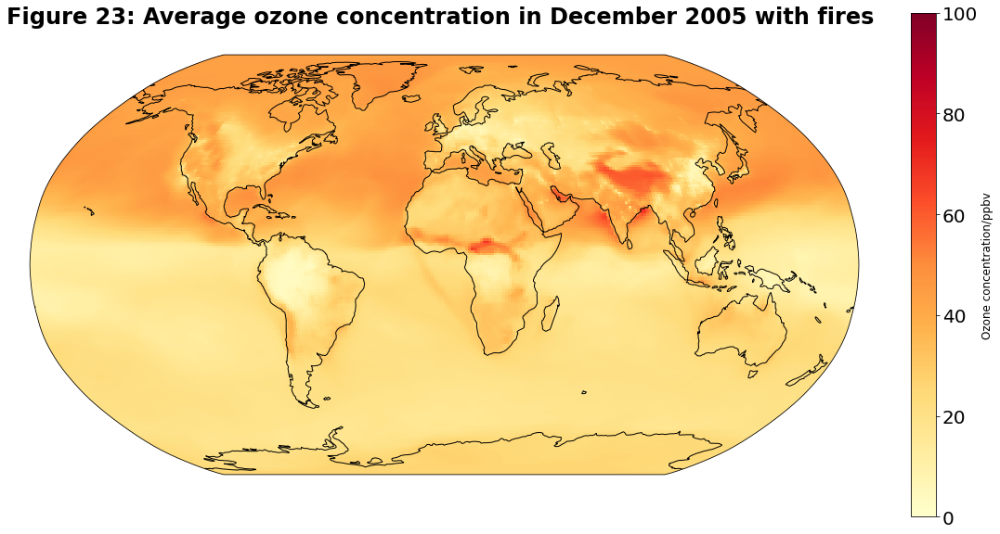

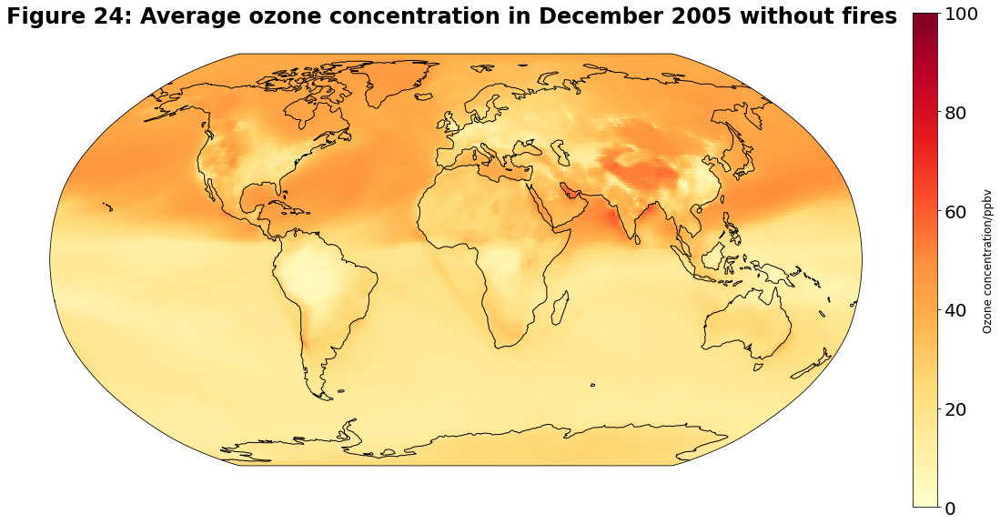

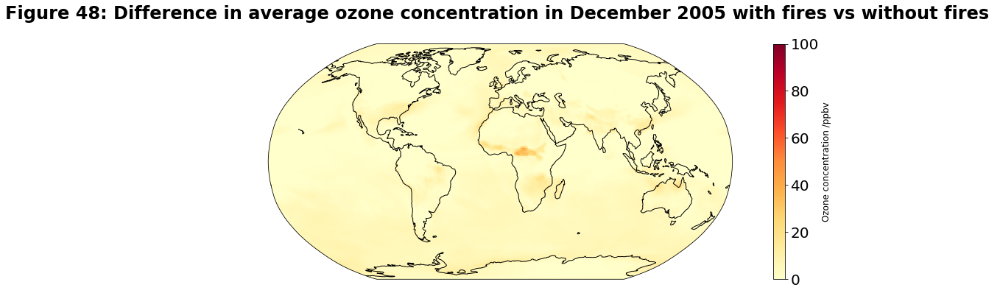

In [73]:
#DECEMBER fires on
#define the dataset 
wfmdd=Dataset(wf_Mdec) 
#print variables
#print (wfmdd.variables)
#extract data from netCDF file to numpy arrays, defining the variables
lat_12 = wfmnd.variables['lat'][:]
lon_12 = wfmnd.variables['lon'][:]
O3_12_mol = wfmnd.variables['O3'][:] #shape is time, lev, lat, lon
lev_12 = wfmnd.variables['lev'][:]

#need to multiply the O3_12_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_12 = O3_12_mol*10**(9)

#check the shape of the O3 array 
print(O3_12.shape) #shape is (1, 56, 192, 288)
O3_12[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_12wf =O3_12[0,55,:,:]
#O3mean_12wf.shape

#plotting data on the figure 
#initiate new figure and axis 
fig23 = plt.figure(figsize=(20,20))
ax23 = fig23.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax23.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg23 = ax23.pcolormesh(lon_12, lat_12, O3mean_12wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax23.set_title('Figure 23: Average ozone concentration in December 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig23.colorbar(fg23, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#DECEMBER fires off

#find ozone without fires
wofmdd=Dataset(wof_Mdec)
#print variables
#print (wofmnd.variables) #variables are the same 
#extract data from netCDF file to numpy arrays, defining the variables
lat_12wof = wofmdd.variables['lat'][:]
lon_12wof = wofmdd.variables['lon'][:]
O3_12wof_mol = wofmdd.variables['O3'][:] #shape is time, lev, lat, lon
lev_12wof = wofmdd.variables['lev'][:]

#need to multiply the O3_12wof_mol variable (ozone data) by 10^(9) to get from moles to ppbv
O3_12wof = O3_12wof_mol*10**(9)

O3_12wof[0,55,:,:].shape
#selecting the surface level only to create a 2d array
O3mean_12wof =O3_12wof[0,55,:,:]

#plot without fires
#plotting data on the figure 
#initiate new figure and axis 
fig24 = plt.figure(figsize=(20,20))
ax24 = fig24.add_subplot(1,1,1, projection=ccrs.Robinson())
#add coastlines
ax24.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg24 = ax24.pcolormesh(lon_12wof, lat_12wof, O3mean_12wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax24.set_title('Figure 24: Average ozone concentration in December 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig24.colorbar(fg24, shrink=0.5)
cb.set_label('Ozone concentration/ppbv', fontsize=12)



#now creating global map of difference in ozone concentraion (fires on- fires off) 
#finding the difference between the fires on and fires off means 
O3_12_difference = O3mean_12wf[:] - O3mean_12wof[:] 

#plotting the difference data on the figure 
fig48 = plt.figure(figsize=(20,20)) 
ax48 = fig48.add_subplot(3,1,1, projection=ccrs.Robinson()) 
#add coastlines 
ax48.coastlines() 
#set size of font 
plt.rc('font', size=20) 
#plot data 
fg48 = ax48.pcolormesh(lon_12wof, lat_12wof, O3_12_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100) 
#Add title 
ax48.set_title('Figure 48: Difference in average ozone concentration in December 2005 with fires vs without fires \n', fontweight='bold') 
#add colorbar 
cb= fig48.colorbar(fg48) 
cb.set_label('Ozone concentration /ppbv', fontsize=12) 


In [74]:
#now creating arrays of mean ozone conc over each season using monthly data

In [75]:
#creating mean winter month O3 conc without fires 
winter_wof = nc.MFDataset([wof_Mdec, wof_Mjan, wof_Mfeb])
#selecting the ozone variable and surface level only to create a 2d array
combined_Wwof = winter_wof.variables['O3'][:][:,55,:,:]
print(combined_Wwof.shape)
wint_wof_array = np.mean(combined_Wwof, axis=0)
#print(wint_wof_array.shape)

#winter with fires
winter_wf = nc.MFDataset([wf_Mdec, wf_Mjan, wf_Mfeb])
combined_Wwf = winter_wf.variables['O3'][:][:,55,:,:]
#print(combined_Wwf.shape)
wint_wf_array = np.mean(combined_Wwf, axis=0)
#print(wint_wf_array.shape)


#mean spring month O3 conc without fires 
spring_wof = nc.MFDataset([wof_Mmar, wof_Mapr, wof_Mmay])
combined_Swof = spring_wof.variables['O3'][:][:,55,:,:]
#print(combined_Swof.shape)
spring_wof_array = np.mean(combined_Swof, axis=0)
#print(spring_wof_array.shape)

#spring with fires
spring_wf = nc.MFDataset([wf_Mmar, wf_Mapr, wf_Mmay])
combined_Swf = spring_wf.variables['O3'][:][:,55,:,:]
#print(combined_Swf.shape)
spring_wf_array = np.mean(combined_Swf, axis=0)
#print(spring_wf_array.shape)


#mean summer month O3 conc without fires 
summer_wof = nc.MFDataset([wof_Mjun, wof_Mjul, wof_Maug])
combined_Srwof = summer_wof.variables['O3'][:][:,55,:,:]
#print(combined_Srwof.shape)
summer_wof_array = np.mean(combined_Srwof, axis=0)
#print(summer_wof_array.shape)

#summer with fires
summer_wf = nc.MFDataset([wf_Mjun, wf_Mjul, wf_Maug])
combined_Srwf = summer_wf.variables['O3'][:][:,55,:,:]
#print(combined_Srwf.shape)
summer_wf_array = np.mean(combined_Srwf, axis=0)
#print(summer_wf_array.shape)


#mean autumn month O3 conc without fires 
autumn_wof = nc.MFDataset([wof_Msep, wof_Moct, wof_Mnov])
combined_Awof = autumn_wof.variables['O3'][:][:,55,:,:]
#print(combined_Awof.shape)
autumn_wof_array = np.mean(combined_Awof, axis=0)
#print(autumn_wof_array.shape)

#autumn with fires
autumn_wf = nc.MFDataset([wf_Msep, wf_Moct, wf_Mnov])
combined_Awf = autumn_wf.variables['O3'][:][:,55,:,:]
#print(combined_Awf.shape)
autumn_wf_array = np.mean(combined_Awf, axis=0)
#print(autumn_wf_array.shape)

(3, 192, 288)


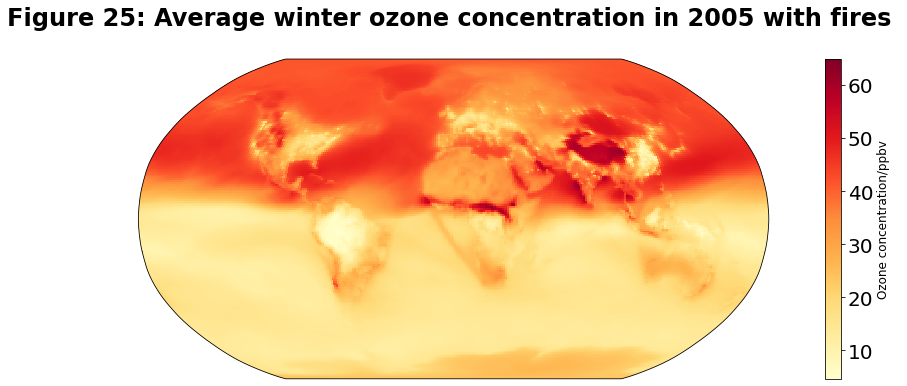

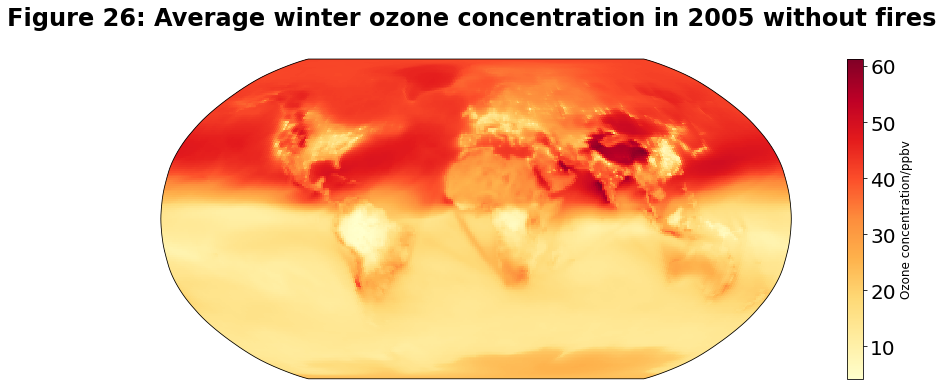

In [76]:
#winter

#with fires
#extract lat/lon data from wint_wf_array to numpy arrays, defining the variables
lat_wint = winter_wf.variables['lat'][:]
lon_wint = winter_wf.variables['lon'][:]
#print(lat_wint.shape)

#need to multiply the O3 variable (ozone data) by 10^(9) to get from moles to ppbv
ppb_Wwf= wint_wf_array*10**(9)

#plotting data on the figure 
#initiate new figure and axis 
fig25 = plt.figure(figsize=(20,20))
ax25 = fig25.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax25.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg25 = ax25.pcolormesh(lon_wint, lat_wint, ppb_Wwf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax25.set_title('Figure 25: Average winter ozone concentration in 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig25.colorbar(fg25)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#without fires
#extract lat/lon data from wint_wof_array to numpy arrays, defining the variables
lat_wint_wof = winter_wof.variables['lat'][:]
lon_wint_wof = winter_wof.variables['lon'][:]
#print(lat_wint.shape)

#need to multiply the O3 variable (ozone data) by 10^(9) to get from moles to ppbv
ppb_Wwof= wint_wof_array*10**(9)

#plotting data on the figure 
#initiate new figure and axis 
fig26 = plt.figure(figsize=(20,20))
ax26 = fig26.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax26.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg26 = ax26.pcolormesh(lon_wint_wof, lat_wint_wof, ppb_Wwof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax26.set_title('Figure 26: Average winter ozone concentration in 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig26.colorbar(fg26)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


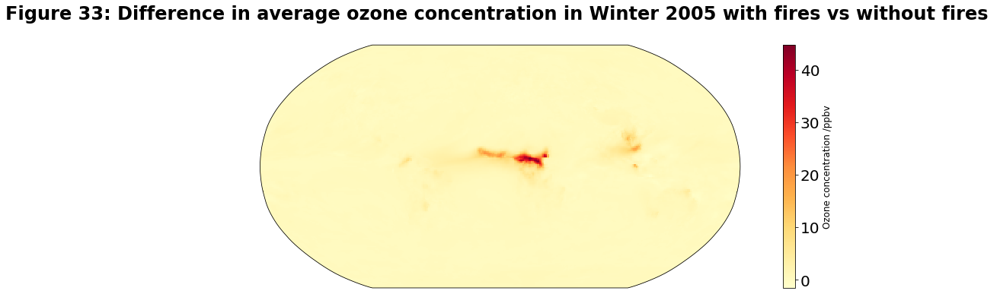

In [14]:
#now creating global maps of difference in ozone concentraion (fires on- fires off) for each season
#winter

#finding the difference between the fires on and fires off means
O3_wint_difference = ppb_Wwf - ppb_Wwof[:]
#print(O3_wint_difference.shape)

#plotting the difference data on the figure 
#initiate new figure and axis 
fig33 = plt.figure(figsize=(20,20))
ax33 = fig33.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax33.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg33 = ax33.pcolormesh(lon_wint_wof, lat_wint_wof, O3_wint_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax33.set_title('Figure 33: Difference in average ozone concentration in Winter 2005 with fires vs without fires \n', fontweight='bold')
#add colorbar
cb= fig33.colorbar(fg33)
cb.set_label('Ozone concentration /ppbv', fontsize=12)

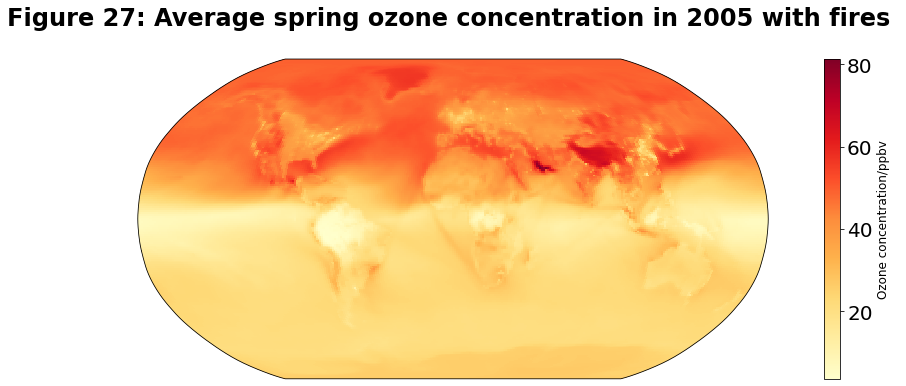

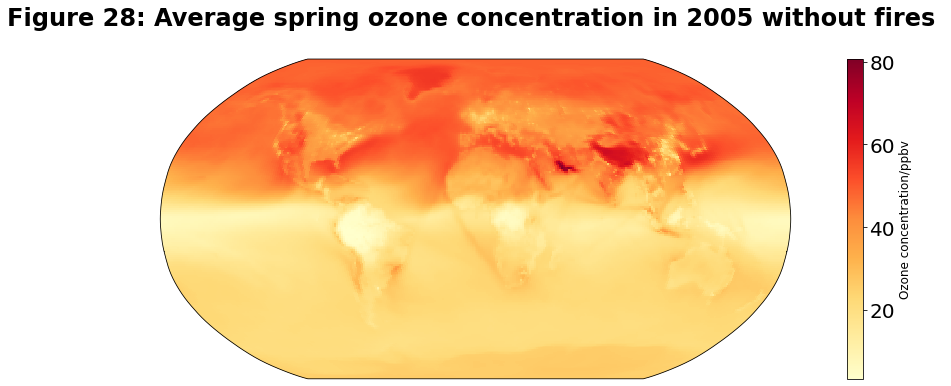

In [15]:
#Spring

#with fires
#extract lat/lon data from spring_wf_array to numpy arrays, defining the variables
lat_spr = spring_wf.variables['lat'][:]
lon_spr = spring_wf.variables['lon'][:]
#print(lat_spr.shape)

#need to multiply the O3 variable (ozone data) by 10^(9) to get from moles to ppbv
ppb_Swf= spring_wf_array*10**(9)

#plotting data on the figure 
#initiate new figure and axis 
fig27 = plt.figure(figsize=(20,20))
ax27 = fig27.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax27.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg27 = ax27.pcolormesh(lon_spr, lat_spr, ppb_Swf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax27.set_title('Figure 27: Average spring ozone concentration in 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig27.colorbar(fg27)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#without fires
#extract lat/lon data from spr_wof_array to numpy arrays, defining the variables
lat_spr_wof = spring_wof.variables['lat'][:]
lon_spr_wof = spring_wof.variables['lon'][:]
#print(lat_spr.shape)

#need to multiply the O3 variable (ozone data) by 10^(9) to get from moles to ppbv
ppb_Swof= spring_wof_array*10**(9)

#plotting data on the figure 
#initiate new figure and axis 
fig28 = plt.figure(figsize=(20,20))
ax28 = fig28.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax28.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg28 = ax28.pcolormesh(lon_spr_wof, lat_spr_wof, ppb_Swof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax28.set_title('Figure 28: Average spring ozone concentration in 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig28.colorbar(fg28)
cb.set_label('Ozone concentration/ppbv', fontsize=12)

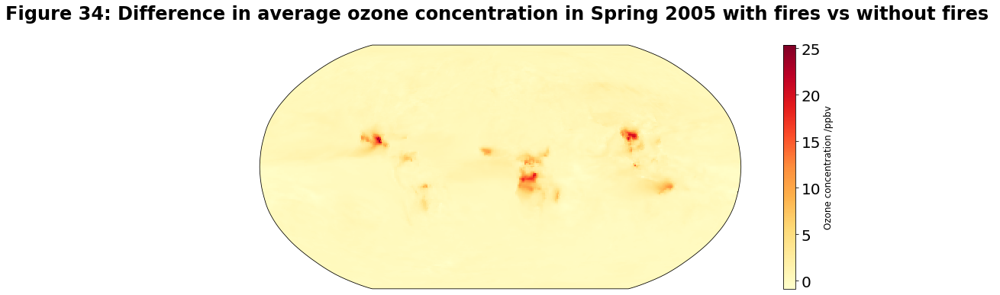

In [16]:
#now creating global maps of difference in ozone concentraion (fires on- fires off) for each season
#spring

#finding the difference between the fires on and fires off means
O3_spring_difference = ppb_Swf - ppb_Swof[:]
#print(O3_spring_difference.shape)

#plotting the difference data on the figure 
#initiate new figure and axis 
fig34 = plt.figure(figsize=(20,20))
ax34 = fig34.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax34.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg34 = ax34.pcolormesh(lon_spr_wof, lat_spr_wof, O3_spring_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax34.set_title('Figure 34: Difference in average ozone concentration in Spring 2005 with fires vs without fires \n', fontweight='bold')
#add colorbar
cb= fig34.colorbar(fg34)
cb.set_label('Ozone concentration /ppbv', fontsize=12)

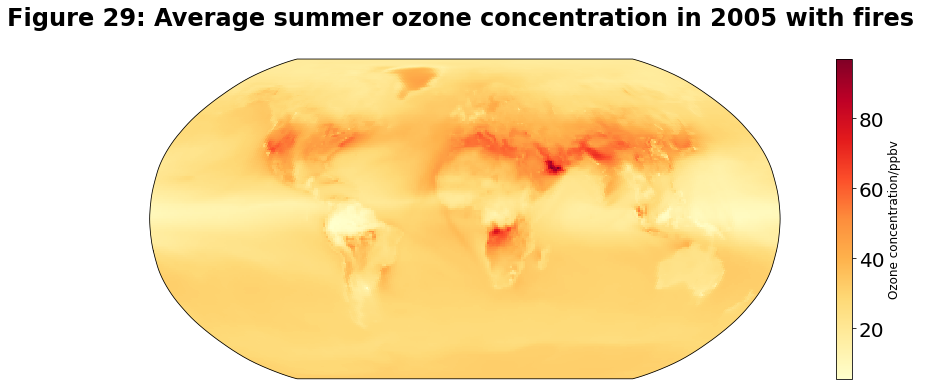

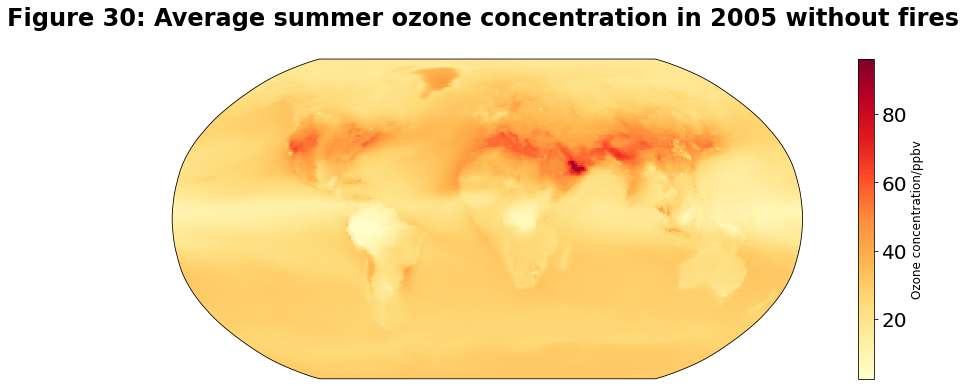

In [17]:
#Summer


#with fires
#extract lat/lon data from summer_wf_array to numpy arrays, defining the variables
lat_sum = summer_wf.variables['lat'][:]
lon_sum = summer_wf.variables['lon'][:]
#print(lat_sum.shape)

#need to multiply the O3 variable (ozone data) by 10^(9) to get from moles to ppbv
ppb_Srwf= summer_wf_array*10**(9)

#plotting data on the figure 
#initiate new figure and axis 
fig29 = plt.figure(figsize=(20,20))
ax29 = fig29.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax29.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg29 = ax29.pcolormesh(lon_sum, lat_sum, ppb_Srwf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax29.set_title('Figure 29: Average summer ozone concentration in 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig29.colorbar(fg29)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#without fires
#extract lat/lon data from sum_wof_array to numpy arrays, defining the variables
lat_sum_wof = summer_wof.variables['lat'][:]
lon_sum_wof = summer_wof.variables['lon'][:]
#print(lat_sum.shape)

#need to multiply the O3 variable (ozone data) by 10^(9) to get from moles to ppbv
ppb_Srwof= summer_wof_array*10**(9)

#plotting data on the figure 
#initiate new figure and axis 
fig30 = plt.figure(figsize=(20,20))
ax30 = fig30.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax30.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg30 = ax30.pcolormesh(lon_sum_wof, lat_sum_wof, ppb_Srwof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax30.set_title('Figure 30: Average summer ozone concentration in 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig30.colorbar(fg30)
cb.set_label('Ozone concentration/ppbv', fontsize=12)

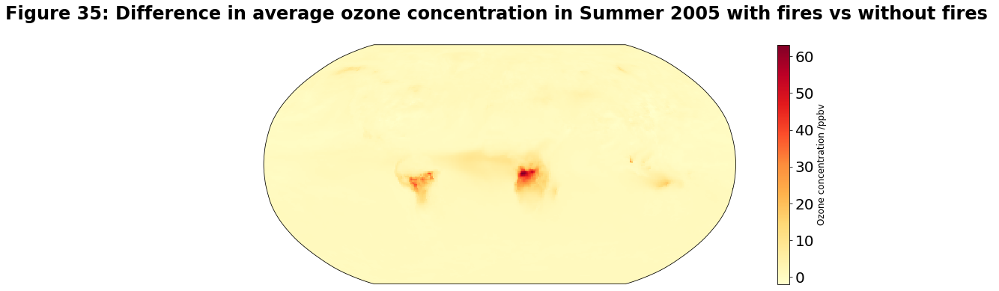

In [18]:
#now creating global maps of difference in ozone concentraion (fires on- fires off) for each season
#summer

#finding the difference between the fires on and fires off means
O3_summer_difference = ppb_Srwf - ppb_Srwof[:]
#print(O3_summer_difference.shape)

#plotting the difference data on the figure 
#initiate new figure and axis 
fig35 = plt.figure(figsize=(20,20))
ax35 = fig35.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax35.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg35 = ax35.pcolormesh(lon_sum_wof, lat_sum_wof, O3_summer_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax35.set_title('Figure 35: Difference in average ozone concentration in Summer 2005 with fires vs without fires \n', fontweight='bold')
#add colorbar
cb= fig35.colorbar(fg35)
cb.set_label('Ozone concentration /ppbv', fontsize=12)

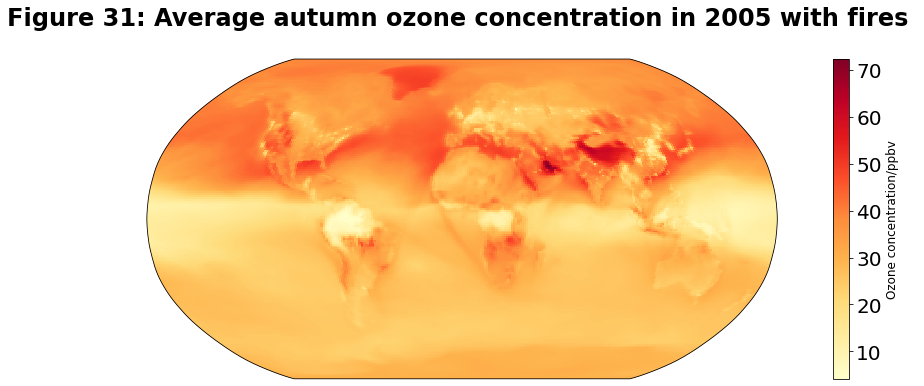

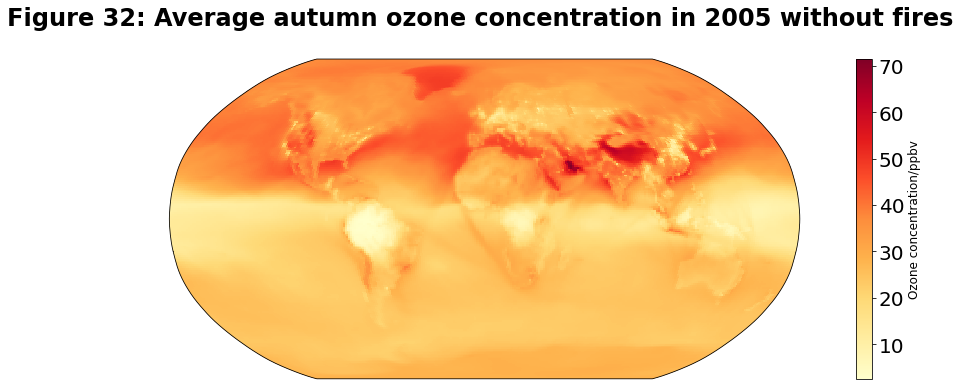

In [19]:
#Autumn

#with fires
#extract lat/lon data from autumn_wf_array to numpy arrays, defining the variables
lat_aut = autumn_wf.variables['lat'][:]
lon_aut = autumn_wf.variables['lon'][:]
#print(lat_aut.shape)

#need to multiply the O3 variable (ozone data) by 10^(9) to get from moles to ppbv
ppb_Awf= autumn_wf_array*10**(9)

#plotting data on the figure 
#initiate new figure and axis 
fig31 = plt.figure(figsize=(20,20))
ax31 = fig31.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax31.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg31 = ax31.pcolormesh(lon_aut, lat_aut, ppb_Awf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax31.set_title('Figure 31: Average autumn ozone concentration in 2005 with fires \n', fontweight='bold')
#add colorbar
cb= fig31.colorbar(fg31)
cb.set_label('Ozone concentration/ppbv', fontsize=12)


#without fires
#extract lat/lon data from aut_wof_array to numpy arrays, defining the variables
lat_aut_wof = autumn_wof.variables['lat'][:]
lon_aut_wof = autumn_wof.variables['lon'][:]
#print(lat_aut.shape)

#need to multiply the O3 variable (ozone data) by 10^(9) to get from moles to ppbv
ppb_Awof= autumn_wof_array*10**(9)

#plotting data on the figure 
#initiate new figure and axis 
fig32 = plt.figure(figsize=(20,20))
ax32 = fig32.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax32.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg32 = ax32.pcolormesh(lon_aut_wof, lat_aut_wof, ppb_Awof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax32.set_title('Figure 32: Average autumn ozone concentration in 2005 without fires \n', fontweight='bold')
#add colorbar
cb= fig32.colorbar(fg32)
cb.set_label('Ozone concentration/ppbv', fontsize=12)

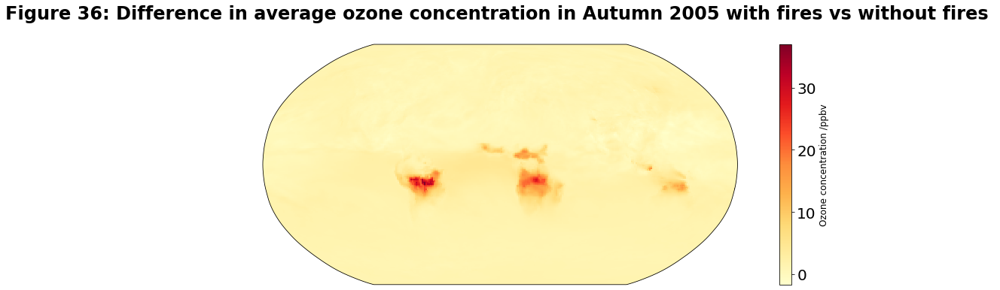

In [20]:
#now creating global maps of difference in ozone concentraion (fires on- fires off) for each season
#autumn

#finding the difference between the fires on and fires off means
O3_autumn_difference = ppb_Awf - ppb_Awof[:]
#print(O3_autumn_difference.shape)

#plotting the difference data on the figure 
#initiate new figure and axis 
fig36 = plt.figure(figsize=(20,20))
ax36 = fig36.add_subplot(3,1,1, projection=ccrs.Robinson())
#add coastlines
ax36.coastlines()
#set size of font
plt.rc('font', size=20)
#plot data
fg36 = ax36.pcolormesh(lon_aut_wof, lat_aut_wof, O3_autumn_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd)
#Add title
ax36.set_title('Figure 36: Difference in average ozone concentration in Autumn 2005 with fires vs without fires \n', fontweight='bold')
#add colorbar
cb= fig36.colorbar(fg36)
cb.set_label('Ozone concentration /ppbv', fontsize=12)

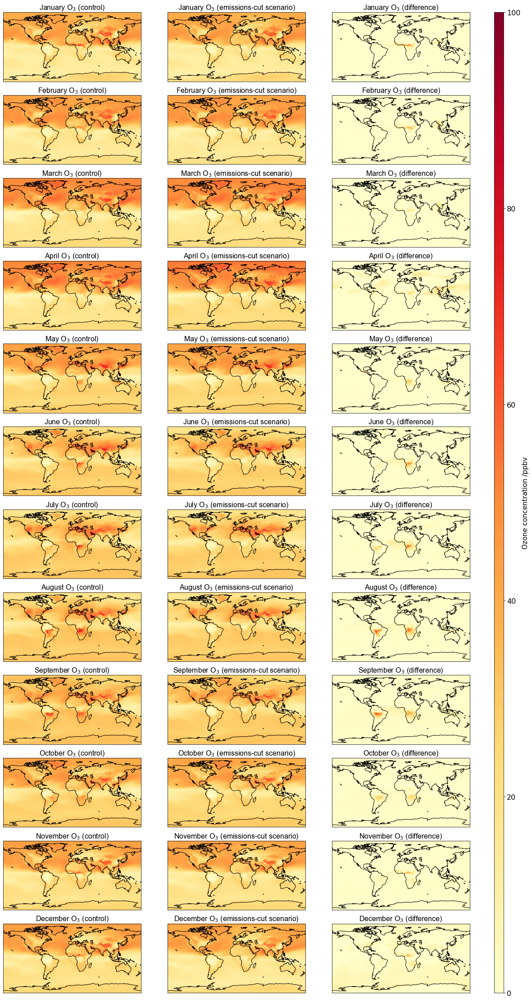

In [106]:
from matplotlib.gridspec import GridSpec
grid_spec = GridSpec(12,4)
grid_spec.set_width_ratios([15,15,15,1])

fig1 = plt.figure(figsize=(20,40))
ax1 = fig1.add_subplot(grid_spec[0,0], projection=ccrs.PlateCarree())
#add coastlines
ax1.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg1 = ax1.pcolormesh(lon_1, lat_1, O3mean_1wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax1.set_title(r'January O$_3$ (control) ', **font)


ax2 =fig1.add_subplot(grid_spec[0,1], projection=ccrs.PlateCarree())
ax2.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg2 = ax2.pcolormesh(lon_1wof, lat_1wof, O3mean_1wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax2.set_title(r'January O$_3$ (emissions-cut scenario) ', **font)



ax37 = fig1.add_subplot(grid_spec[0,2], projection=ccrs.PlateCarree())
#add coastlines
ax37.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg37 = ax37.pcolormesh(lon_1wof, lat_1wof, O3_1_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax37.set_title(r'January O$_3$ (difference) ', **font)


ax3 = fig1.add_subplot(grid_spec[1,0], projection=ccrs.PlateCarree())
#add coastlines
ax3.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg3 = ax3.pcolormesh(lon_2, lat_2, O3mean_2wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax3.set_title(r'February O$_3$ (control)', **font)


ax4 = fig1.add_subplot(grid_spec[1,1], projection=ccrs.PlateCarree())
#add coastlines
ax4.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg4 = ax4.pcolormesh(lon_2, lat_2, O3mean_2wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax4.set_title(r'February O$_3$ (emissions-cut scenario)', **font)


ax38 = fig1.add_subplot(grid_spec[1,2], projection=ccrs.PlateCarree())
#add coastlines
ax38.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg38 = ax38.pcolormesh(lon_2, lat_2, O3_2_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax38.set_title(r'February O$_3$ (difference)', **font)





ax5 = fig1.add_subplot(grid_spec[2,0], projection=ccrs.PlateCarree())
#add coastlines
ax5.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg5 = ax5.pcolormesh(lon_1, lat_1, O3mean_3wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax5.set_title(r'March O$_3$ (control) ', **font)


ax6 =fig1.add_subplot(grid_spec[2,1], projection=ccrs.PlateCarree())
ax6.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg6 = ax6.pcolormesh(lon_1wof, lat_1wof, O3mean_3wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax6.set_title(r'March O$_3$ (emissions-cut scenario) ', **font)



ax39 = fig1.add_subplot(grid_spec[2,2], projection=ccrs.PlateCarree())
#add coastlines
ax39.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg39 = ax39.pcolormesh(lon_1wof, lat_1wof, O3_3_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax39.set_title(r'March O$_3$ (difference) ', **font)



ax7 = fig1.add_subplot(grid_spec[3,0], projection=ccrs.PlateCarree())
#add coastlines
ax7.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg7 = ax7.pcolormesh(lon_1, lat_1, O3mean_4wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax7.set_title(r'April O$_3$ (control) ', **font)


ax8 =fig1.add_subplot(grid_spec[3,1], projection=ccrs.PlateCarree())
ax8.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg8 = ax8.pcolormesh(lon_1wof, lat_1wof, O3mean_4wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax8.set_title(r'April O$_3$ (emissions-cut scenario) ', **font)



ax40 = fig1.add_subplot(grid_spec[3,2], projection=ccrs.PlateCarree())
#add coastlines
ax40.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg40 = ax40.pcolormesh(lon_1wof, lat_1wof, O3_4_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax40.set_title(r'April O$_3$ (difference) ', **font)



ax9 = fig1.add_subplot(grid_spec[4,0], projection=ccrs.PlateCarree())
#add coastlines
ax9.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg9 = ax9.pcolormesh(lon_1, lat_1, O3mean_5wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax9.set_title(r'May O$_3$ (control) ', **font)


ax10 =fig1.add_subplot(grid_spec[4,1], projection=ccrs.PlateCarree())
ax10.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg10 = ax10.pcolormesh(lon_1wof, lat_1wof, O3mean_5wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax10.set_title(r'May O$_3$ (emissions-cut scenario) ', **font)



ax41 = fig1.add_subplot(grid_spec[4,2], projection=ccrs.PlateCarree())
#add coastlines
ax41.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg41 = ax41.pcolormesh(lon_1wof, lat_1wof, O3_5_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax41.set_title(r'May O$_3$ (difference) ', **font)



ax11 = fig1.add_subplot(grid_spec[5,0], projection=ccrs.PlateCarree())
#add coastlines
ax11.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg11 = ax11.pcolormesh(lon_1, lat_1, O3mean_6wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax11.set_title(r'June O$_3$ (control) ', **font)


ax12 =fig1.add_subplot(grid_spec[5,1], projection=ccrs.PlateCarree())
ax12.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg12 = ax12.pcolormesh(lon_1wof, lat_1wof, O3mean_6wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax12.set_title(r'June O$_3$ (emissions-cut scenario) ', **font)



ax42 = fig1.add_subplot(grid_spec[5,2], projection=ccrs.PlateCarree())
#add coastlines
ax42.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg42 = ax42.pcolormesh(lon_1wof, lat_1wof, O3_6_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax42.set_title(r'June O$_3$ (difference) ', **font)




ax13 = fig1.add_subplot(grid_spec[6,0], projection=ccrs.PlateCarree())
#add coastlines
ax13.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg13 = ax13.pcolormesh(lon_1, lat_1, O3mean_7wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax13.set_title(r'July O$_3$ (control) ', **font)


ax14 =fig1.add_subplot(grid_spec[6,1], projection=ccrs.PlateCarree())
ax14.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg14 = ax14.pcolormesh(lon_1wof, lat_1wof, O3mean_7wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax14.set_title(r'July O$_3$ (emissions-cut scenario) ', **font)



ax43 = fig1.add_subplot(grid_spec[6,2], projection=ccrs.PlateCarree())
#add coastlines
ax43.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg43 = ax43.pcolormesh(lon_1wof, lat_1wof, O3_7_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax43.set_title(r'July O$_3$ (difference) ', **font)




ax15 = fig1.add_subplot(grid_spec[7,0], projection=ccrs.PlateCarree())
#add coastlines
ax15.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg15 = ax15.pcolormesh(lon_1, lat_1, O3mean_8wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax15.set_title(r'August O$_3$ (control) ', **font)


ax16 =fig1.add_subplot(grid_spec[7,1], projection=ccrs.PlateCarree())
ax16.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg16 = ax16.pcolormesh(lon_1wof, lat_1wof, O3mean_8wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax16.set_title(r'August O$_3$ (emissions-cut scenario) ', **font)



ax44 = fig1.add_subplot(grid_spec[7,2], projection=ccrs.PlateCarree())
#add coastlines
ax44.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg44 = ax44.pcolormesh(lon_1wof, lat_1wof, O3_8_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax44.set_title(r'August O$_3$ (difference) ', **font)




ax17 = fig1.add_subplot(grid_spec[8,0], projection=ccrs.PlateCarree())
#add coastlines
ax17.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg17 = ax17.pcolormesh(lon_1, lat_1, O3mean_9wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax17.set_title(r'September O$_3$ (control) ', **font)


ax18 =fig1.add_subplot(grid_spec[8,1], projection=ccrs.PlateCarree())
ax18.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg18 = ax18.pcolormesh(lon_1wof, lat_1wof, O3mean_9wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax18.set_title(r'September O$_3$ (emissions-cut scenario) ', **font)



ax45 = fig1.add_subplot(grid_spec[8,2], projection=ccrs.PlateCarree())
#add coastlines
ax45.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg45 = ax45.pcolormesh(lon_1wof, lat_1wof, O3_9_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax45.set_title(r'September O$_3$ (difference) ', **font)




ax19 = fig1.add_subplot(grid_spec[9,0], projection=ccrs.PlateCarree())
#add coastlines
ax19.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg19 = ax19.pcolormesh(lon_1, lat_1, O3mean_10wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax19.set_title(r'October O$_3$ (control) ', **font)


ax20 =fig1.add_subplot(grid_spec[9,1], projection=ccrs.PlateCarree())
ax20.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg20 = ax20.pcolormesh(lon_1wof, lat_1wof, O3mean_10wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax20.set_title(r'October O$_3$ (emissions-cut scenario) ', **font)



ax46 = fig1.add_subplot(grid_spec[9,2], projection=ccrs.PlateCarree())
#add coastlines
ax46.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg46 = ax46.pcolormesh(lon_1wof, lat_1wof, O3_10_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax46.set_title(r'October O$_3$ (difference) ', **font)




ax21 = fig1.add_subplot(grid_spec[10,0], projection=ccrs.PlateCarree())
#add coastlines
ax21.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg21 = ax21.pcolormesh(lon_1, lat_1, O3mean_11wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax21.set_title(r'November O$_3$ (control) ', **font)


ax22 =fig1.add_subplot(grid_spec[10,1], projection=ccrs.PlateCarree())
ax22.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg22 = ax22.pcolormesh(lon_1wof, lat_1wof, O3mean_11wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax22.set_title(r'November O$_3$ (emissions-cut scenario) ', **font)



ax47 = fig1.add_subplot(grid_spec[10,2], projection=ccrs.PlateCarree())
#add coastlines
ax47.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg47 = ax47.pcolormesh(lon_1wof, lat_1wof, O3_11_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax47.set_title(r'November O$_3$ (difference) ', **font)




ax23 = fig1.add_subplot(grid_spec[11,0], projection=ccrs.PlateCarree())
#add coastlines
ax23.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg23 = ax23.pcolormesh(lon_1, lat_1, O3mean_12wf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax23.set_title(r'December O$_3$ (control) ', **font)


ax24 =fig1.add_subplot(grid_spec[11,1], projection=ccrs.PlateCarree())
ax24.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg24 = ax24.pcolormesh(lon_1wof, lat_1wof, O3mean_12wof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax24.set_title(r'December O$_3$ (emissions-cut scenario) ', **font)



ax48 = fig1.add_subplot(grid_spec[11,2], projection=ccrs.PlateCarree())
#add coastlines
ax48.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg48 = ax48.pcolormesh(lon_1wof, lat_1wof, O3_12_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax48.set_title(r'December O$_3$ (difference) ', **font)






#add colorbar
ax100 =fig1.add_subplot(grid_spec[:,3])
cb= fig1.colorbar(fg1, ax100)
cb.set_label('Ozone concentration /ppbv', fontsize=15)


In [1]:
#make figure for seasonal ozone plots
grid_spec = GridSpec(4,4)
grid_spec.set_width_ratios([10,10,10,0.7])

fig2 = plt.figure(figsize=(20,15))
ax25 = fig2.add_subplot(grid_spec[0,0], projection=ccrs.PlateCarree())
#add coastlines
ax25.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg25 = ax25.pcolormesh(lon_wint, lat_wint, ppb_Wwf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax25.set_title(r'Winter O$_3$ (control) ', **font)



ax26 = fig2.add_subplot(grid_spec[0,1], projection=ccrs.PlateCarree())
#add coastlines
ax26.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg26 = ax26.pcolormesh(lon_wint, lat_wint, ppb_Wwof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax26.set_title(r'Winter O$_3$ (emissions-cut scenario) ', **font)




ax49 = fig2.add_subplot(grid_spec[0,2], projection=ccrs.PlateCarree())
#add coastlines
ax49.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg49 = ax49.pcolormesh(lon_wint, lat_wint, O3_wint_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax49.set_title(r'Winter O$_3$ (difference) ', **font)




ax27 = fig2.add_subplot(grid_spec[1,0], projection=ccrs.PlateCarree())
#add coastlines
ax27.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg27 = ax27.pcolormesh(lon_spr, lat_spr, ppb_Swf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax27.set_title(r'Spring O$_3$ (control) ', **font)



ax28 = fig2.add_subplot(grid_spec[1,1], projection=ccrs.PlateCarree())
#add coastlines
ax28.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg28 = ax28.pcolormesh(lon_spr, lat_spr, ppb_Swof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax28.set_title(r'Spring O$_3$ (emissions-cut scenario) ', **font)




ax50 = fig2.add_subplot(grid_spec[1,2], projection=ccrs.PlateCarree())
#add coastlines
ax50.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg50 = ax50.pcolormesh(lon_spr, lat_spr, O3_spring_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax50.set_title(r'Spring O$_3$ (difference) ', **font)




ax29 = fig2.add_subplot(grid_spec[2,0], projection=ccrs.PlateCarree())
#add coastlines
ax29.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg29 = ax29.pcolormesh(lon_sum, lat_sum, ppb_Srwf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax29.set_title(r'Summer O$_3$ (control) ', **font)



ax30 = fig2.add_subplot(grid_spec[2,1], projection=ccrs.PlateCarree())
#add coastlines
ax30.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg30 = ax30.pcolormesh(lon_sum, lat_sum, ppb_Srwof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax30.set_title(r'Summer O$_3$ (emissions-cut scenario) ', **font)




ax51 = fig2.add_subplot(grid_spec[2,2], projection=ccrs.PlateCarree())
#add coastlines
ax51.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg51 = ax51.pcolormesh(lon_sum, lat_sum, O3_summer_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax51.set_title(r'Summer O$_3$ (difference) ', **font)





ax31 = fig2.add_subplot(grid_spec[3,0], projection=ccrs.PlateCarree())
#add coastlines
ax31.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg31 = ax31.pcolormesh(lon_aut, lat_aut, ppb_Awf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax31.set_title(r'Autumn O$_3$ (control) ', **font)



ax32 = fig2.add_subplot(grid_spec[3,1], projection=ccrs.PlateCarree())
#add coastlines
ax32.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg32 = ax32.pcolormesh(lon_aut, lat_aut, ppb_Awof, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax32.set_title(r'Autumn O$_3$ (emissions-cut scenario) ', **font)




ax52 = fig2.add_subplot(grid_spec[3,2], projection=ccrs.PlateCarree())
#add coastlines
ax52.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg52 = ax52.pcolormesh(lon_aut, lat_aut, O3_autumn_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax52.set_title(r'Autumn O$_3$ (difference) ', **font)



#add colorbar
ax101 =fig2.add_subplot(grid_spec[:,3])
cb= fig2.colorbar(fg2, ax101)
cb.set_label('Ozone concentration /ppbv', fontsize=15)

NameError: name 'GridSpec' is not defined

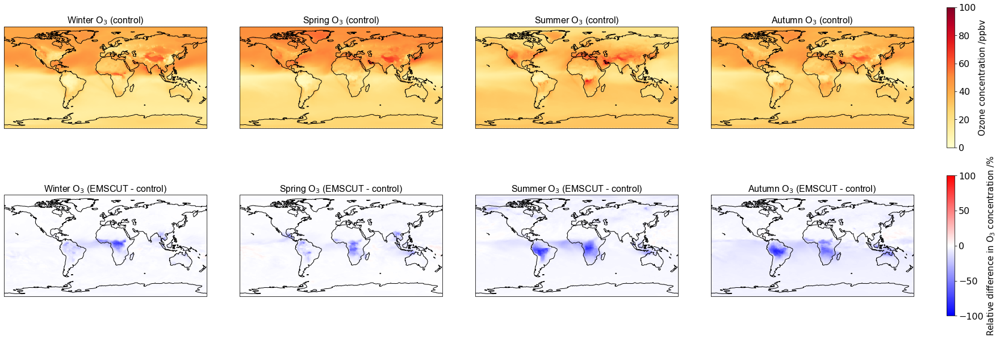

In [161]:
#find the relative diff in ozone for seasons as a percentage
#redefine same variable names
O3_wint_difference = ((ppb_Wwof[:]- ppb_Wwf[:])/ppb_Wwf[:])*100
O3_spring_difference = ((ppb_Swof[:] - ppb_Swf[:])/ppb_Swf[:])*100
O3_summer_difference = ((ppb_Srwof[:] - ppb_Srwf[:])/ppb_Srwf[:])*100
O3_autumn_difference = ((ppb_Awof[:] - ppb_Awf[:])/ppb_Awf[:])*100




#new layout seasonal maps 5 columns, 2 rows control with diff underneath (diff scalebar)
#make figure for seasonal ozone plots
grid_spec = GridSpec(2,5)
grid_spec.set_width_ratios([5,5,5,5,0.2])

fig3 = plt.figure(figsize=(30,10))
ax53 = fig3.add_subplot(grid_spec[0,0], projection=ccrs.PlateCarree())
#add coastlines
ax53.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg53 = ax53.pcolormesh(lon_wint, lat_wint, ppb_Wwf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax53.set_title(r'Winter O$_3$ (control) ', **font)



ax54 = fig3.add_subplot(grid_spec[1,0], projection=ccrs.PlateCarree())
#add coastlines
ax54.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg54 = ax54.pcolormesh(lon_wint, lat_wint, O3_wint_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.bwr, zorder=0, vmin=-100 , vmax=100)
#Add title
ax54.set_title(r'Winter O$_3$ (EMSCUT - control) ', **font)




ax55 = fig3.add_subplot(grid_spec[0,1], projection=ccrs.PlateCarree())
#add coastlines
ax55.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg55 = ax55.pcolormesh(lon_spr, lat_spr, ppb_Swf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax55.set_title(r'Spring O$_3$ (control) ', **font)



ax56 = fig3.add_subplot(grid_spec[1,1], projection=ccrs.PlateCarree())
#add coastlines
ax56.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg56 = ax56.pcolormesh(lon_spr, lat_spr, O3_spring_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.bwr, zorder=0, vmin=-100 , vmax=100)
#Add title
ax56.set_title(r'Spring O$_3$ (EMSCUT - control) ', **font)




ax57 = fig3.add_subplot(grid_spec[0,2], projection=ccrs.PlateCarree())
#add coastlines
ax57.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg57 = ax57.pcolormesh(lon_sum, lat_sum, ppb_Srwf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax57.set_title(r'Summer O$_3$ (control) ', **font)





ax58 = fig3.add_subplot(grid_spec[1,2], projection=ccrs.PlateCarree())
#add coastlines
ax58.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg58 = ax58.pcolormesh(lon_sum, lat_sum, O3_summer_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.bwr, zorder=0, vmin=-100 , vmax=100)
#Add title
ax58.set_title(r'Summer O$_3$ (EMSCUT - control) ', **font)





ax59 = fig3.add_subplot(grid_spec[0,3], projection=ccrs.PlateCarree())
#add coastlines
ax59.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg59 = ax59.pcolormesh(lon_aut, lat_aut, ppb_Awf, transform= ccrs.PlateCarree(), cmap=plt.cm.YlOrRd, zorder=0, vmin=0 , vmax=100)
#Add title
ax59.set_title(r'Autumn O$_3$ (control) ', **font)



ax60 = fig3.add_subplot(grid_spec[1,3], projection=ccrs.PlateCarree())
#add coastlines
ax60.coastlines()
#set size of font
plt.rc('font', size=16)
#plot data
fg60 = ax60.pcolormesh(lon_aut, lat_aut, O3_autumn_difference, transform= ccrs.PlateCarree(), cmap=plt.cm.bwr, zorder=0, vmin=-100 , vmax=100)
#Add title
ax60.set_title(r'Autumn O$_3$ (EMSCUT - control) ', **font)


#add colorbar
ax102 =fig3.add_subplot(grid_spec[0,4])
cb= fig3.colorbar(fg59, ax102, shrink=0.2)
cb.set_label('Ozone concentration /ppbv', fontsize=15)

#add colorbar
ax103 =fig3.add_subplot(grid_spec[1,4])
cb= fig3.colorbar(fg60, ax103, shrink=0.2)
cb.set_label(r'Relative difference in O$_3$ concentration /%', fontsize=15)
